# Prepare Convex Gating on COVID-19 patients flow cytometry data

In this notebook, we prepare the data to run convex gating on FACS sorted PBMCs from COVID-19 patients. Specifically, we identified CD16+ T cells in similar cohorts, and we aim to provide gating strategies for these populations.

In [5]:
%load_ext autoreload
%autoreload 2

In [1]:
import scanpy as sc
import anndata as ann
import numpy as np
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import datetime

In [3]:
import os
import re
from pathlib import Path

In [22]:
import os

In [6]:
import convexgating as cg 
from convex_hull_add_on import add_tight_analysis

In [7]:
from contour_scatter import contour_lines_separate_outliers, generate_lut_func, prepare_contour_plot

In [8]:
sc.logging.print_versions()
sc.settings.verbosity = 3 

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.8.0
scanpy      1.8.1
sinfo       0.3.4
-----
PIL                                 8.4.0
anyio                               NA
asciitree                           NA
attr                                21.2.0
autoreload                          NA
babel                               2.9.1
backcall                            0.2.0
beta_ufunc                          NA
binom_ufunc                         NA
brotli                              1.0.9
certifi                             2021.10

Import auxiliary functions.

In [9]:
import convex_hull_add_on as ch

Get date.

In [10]:
now = datetime.datetime.now()
today = now.strftime("%Y%m%d")

## Introduction

In this notebook, we postprocess COVID-19 FACS data, which have been collected in the [Georg et al. study](https://www.sciencedirect.com/science/article/pii/S0092867421015622?via%3Dihub) and were thankfully provided by Lorenzo Bonaguro via internal communication as FlowJo Workspace archive. 

We prepare data tasks to run convex gating. We want to run the following tasks:

1. Full panel
2. Reduced panel (CD3, CD4, CD8, CD16)
3. Panel from cyTOF strategy
4. Panel from CITE-seq strategy

Notably, using the panels suggested by the cyTOF and CITE-seq panel are more difficult to adapt, because the overlap of the panels is minimal.

Set data path.

In [11]:
path_data = './../../SL_FACS/data/Bonaguro-COVID19/'

Load data.

In [18]:
#save to file
adata = sc.read(path_data + 'H5AD/' + 'data_cd45pos_facs_covid_anno_lb.h5ad') 

In [12]:
adata.var

,channel,marker,signal_type
CD56,YG E 586/15-A,CD56,area
CD3,YG D 610/20-A,CD3,area
CD11c,YG C 670/30-A,CD11c,area
Siglec8,YG A 780/60-A,Siglec8,area
CD66b,Blue E 530/30-A,CD66b,area
CD14,Blue B 710/50-A,CD14,area
CD203c,Red C 670/30-A,CD203c,area
CD1c,Red B 730/45-A,CD1c,area
CD19,Red A 780/60-A,CD19,area
HLA-DR,Vio H 431/28-A,HLA-DR,area


## Data overview

Let us check how many cells we have per patient and per condition.

In [11]:
pd.crosstab(adata.obs['status_max'],  
            [adata.obs['manual cell type lvl 3']],
            margins=True)

manual cell type lvl 3,B cell,T cell,NK cell,Other monocyte,Other granulocyte,not annotated,CD4+ T cell,CD8+ T cell,NKT cell,Classical monocyte,Intermediate monocyte,Non-classical monocyte,Eosinophil,Neutrophil,CD16+ CD4+ T cell,CD16+ CD8+ T cell,All
status_max,,,,,,,,,,,,,,,,,
ctrl,85379,42477,201873,10174,19062,102248,385850,148735,35482,218450,13736,10021,118213,1315019,212,1868,2708799
mild,34944,15497,60088,1379,10395,24230,131908,49877,13469,36647,5553,2645,29147,254337,44,4413,674573
severe,42062,25397,70696,24292,259546,103042,178274,69860,18712,202064,32163,10592,235555,1768435,81,713,3041484
All,162385,83371,332657,35845,289003,229520,696032,268472,67663,457161,51452,23258,382915,3337791,337,6994,6424856


Select only COVID-19 patients.

In [14]:
adata_covid = adata[adata.obs['status_max'].isin(['mild', 'severe'])].copy()

## Convex Gating runs

### CD16+ CD4+ T cells

Enrich for target population.

In [16]:
target_mask = adata_covid.obs['manual cell type lvl 3']=='CD16+ CD4+ T cell'
adata_target = adata_covid[target_mask].copy()
adata_nontarget = adata_covid[~target_mask].copy()

In [17]:
adata_target.n_obs 

125

In [18]:
adata_nontarget.n_obs

3715932

In [19]:
sc.pp.subsample(adata_nontarget, n_obs = adata_target.n_obs * 15)

Merge both target and non-target populations.

In [20]:
adata_full = ann.AnnData.concatenate(*[adata_target, adata_nontarget], index_unique=None)

In [21]:
adata_full

AnnData object with n_obs × n_vars = 2000 × 15
    obs: 'FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'Time', 'sample', 'sample_ID', 'donor_initials', 'exp_date', 'status_max', 'status_exp_date', 'control', 'WHO_classification', 'WHO_max', 'days_post_symptoms', 'exclusion', 'time_point', 'merged_anno', 'total_wbc_count', 'comments', 'bad_HLA-DR', 'gate_root', 'gate_Cells', 'gate_Cells-Single Cells', 'gate_Single Cells-Single Cells', 'gate_live', 'gate_CD45+', 'gate_Granulocytes', 'gate_Eosinophils', 'gate_Neutrophils', 'gate_Q2: CD16+ , Siglec8+', 'gate_Q4: CD16- , Siglec8-', 'gate_PBMC', 'gate_B cells', 'gate_CD3+', 'gate_NKT', 'gate_CD3+-others', 'gate_CD4 T cells', 'gate_CD8 T cells', 'gate_PBMC-others', 'gate_NK cells', 'gate_others-others', 'gate_monocytes', 'gate_CD16 mono', 'gate_classical', 'gate_HLA-DR, CD11c subset', 'gate_intermediate', 'gate_Q4: CD16- , CD14-', 'batch', 'covid_status', 'manual cell type lvl 1', 'manual cell type lvl 2', 'manual cell type lvl 3'
    

#### Full panel

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.342466     0.738916     0.720812     0.687500     0.637838
recall        0.600000     0.600000     0.568000     0.528000     0.472000
precision     0.239617     0.961538     0.986111     0.985075     0.983333


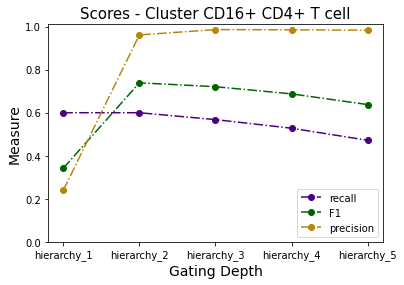

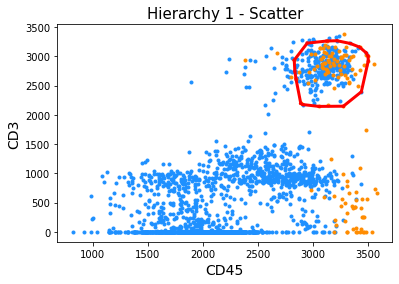

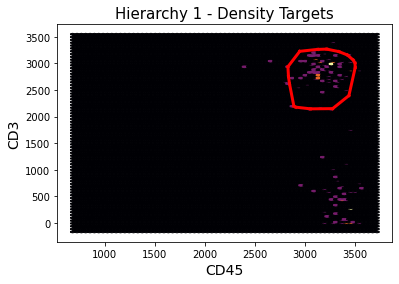

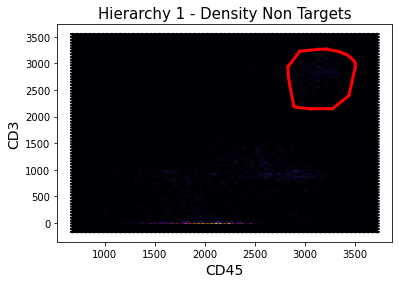

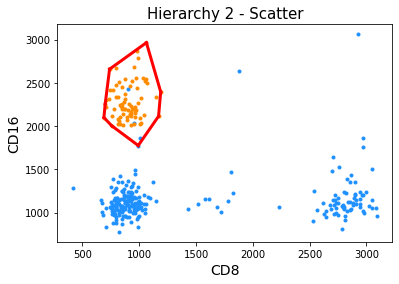

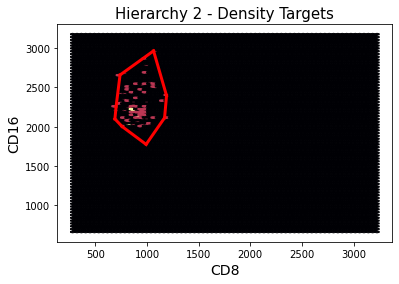

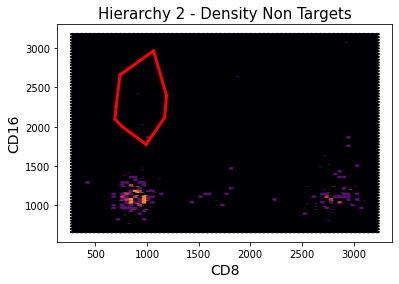

In [57]:
group = ['CD16+ CD4+ T cell'] #
cluster_string = 'manual cell type lvl 3'
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = list(adata_full.var.index),
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )

meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd4_full.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Postprocess result plots. We have to generate a transformation function and its inverse for the bi-exponential normalization.

In [20]:
path_data = './../../SL_FACS/data/Bonaguro-COVID19/'
path_fcs = path_data + 'fcs_files/'
fcs_files = os.listdir(path_fcs)
workspace_files = os.listdir(path_data)

workspace_params_files = [fileID for fileID in workspace_files 
                          if fileID.startswith('workspace_bonaguro_params')]
#Get one of the FCS workspace param files
fcs_file = fcs_files[8]

#add params for biex trafo
workspace_param_file = [fileID for fileID in workspace_params_files
                                if fileID.count(fcs_file.split('.fcs')[0])>0]

#add transformation info
params = pd.read_csv(path_data + workspace_param_file[0], index_col = 0)
rename_col = [idx.split('parameters.')[-1] for idx in params.columns.values]
params.columns = rename_col
#create new marker dictionary for renaming index in params data frame
marker_dict_params = {}
for key in adata.var['channel'].values:
    key_new = key.replace('/', '_')
    marker_dict_params[key_new] = adata.var.loc[adata.var['channel'] == key,
                                                            adata.var.columns == 'marker'
                                                           ].values[0][0]
params.rename(index=marker_dict_params, inplace=True)

In [23]:
lut_func = {}
inverse_lut_func = {}
for marker in params.index:
    params_tmp = params.loc[marker]
    lut_func_tmp, inverse_lut_func_tmp = generate_lut_func(
                         neg=params_tmp['neg'], 
                         width_basis=params_tmp['widthBasis'], 
                         pos=params_tmp['pos'], 
                         max_value=params_tmp['maxValue'])
    lut_func[marker] = lut_func_tmp
    inverse_lut_func[marker] = inverse_lut_func_tmp

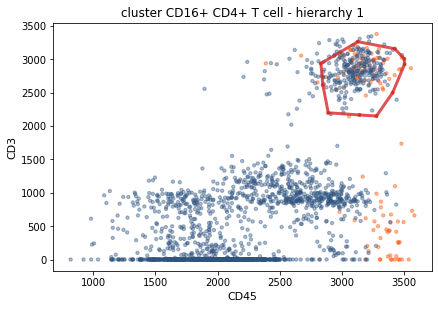

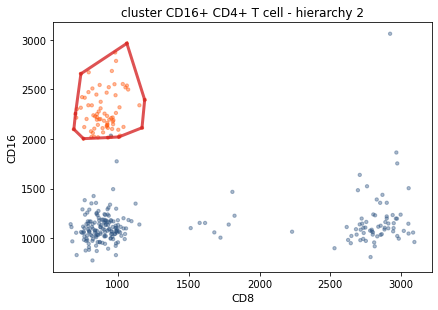

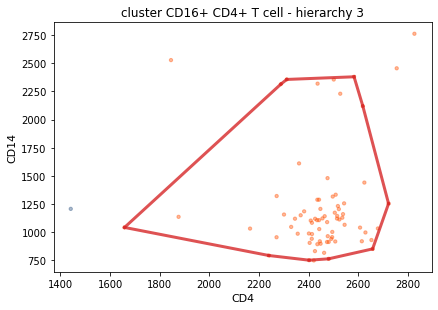

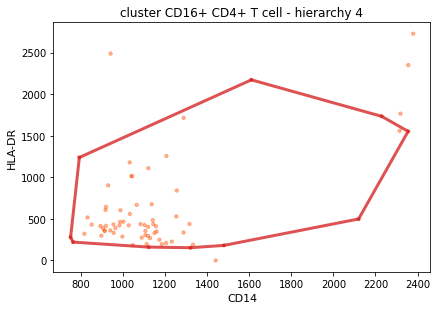

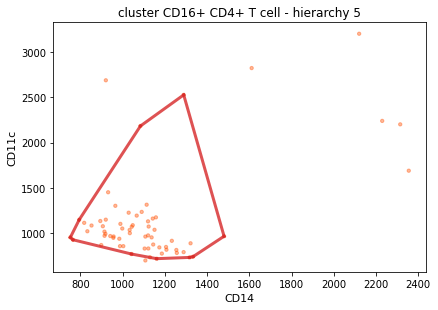

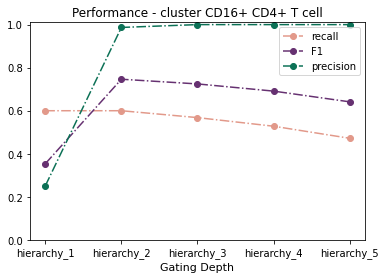

In [60]:
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
meta_info_path = os.path.join(save_path, "meta_info_cd4_full.npy")
for key in keys:
    target_location = os.path.join(save_path, 'full')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

In [24]:
add_hull_path = os.path.join('./../', 'data', 'FACS_COVID_LB','cg_lvl3')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


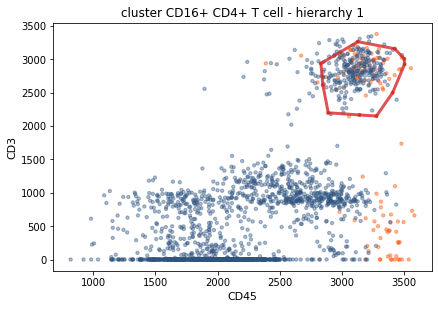

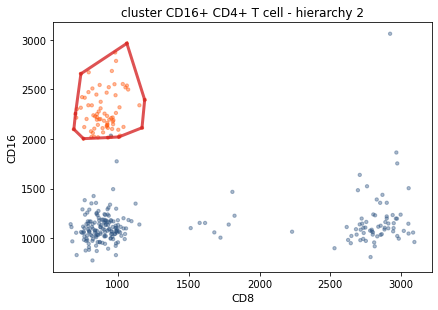

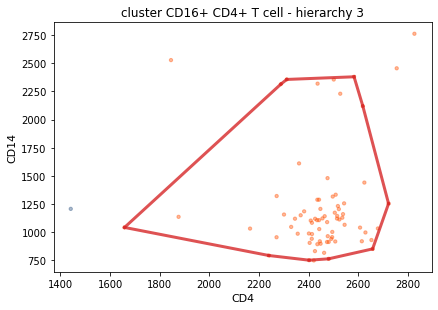

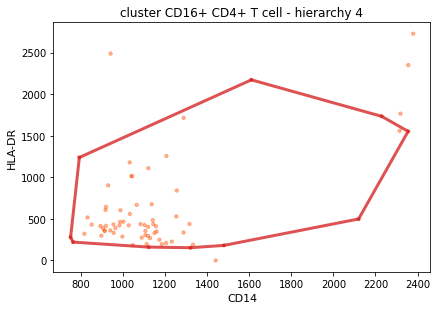

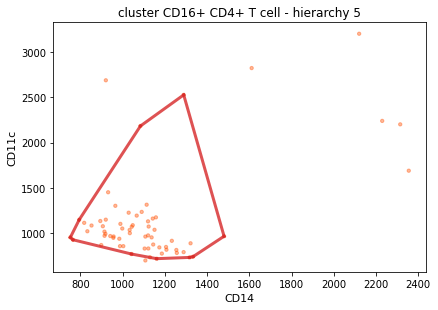

In [28]:
meta_info_path = os.path.join(add_hull_path, "meta_info_cd4_full.npy")
meta_info = np.load(meta_info_path,allow_pickle=True).item()
population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)

nr_targets :125
nr_non_targets :1875
nr_targets :75
nr_non_targets :224


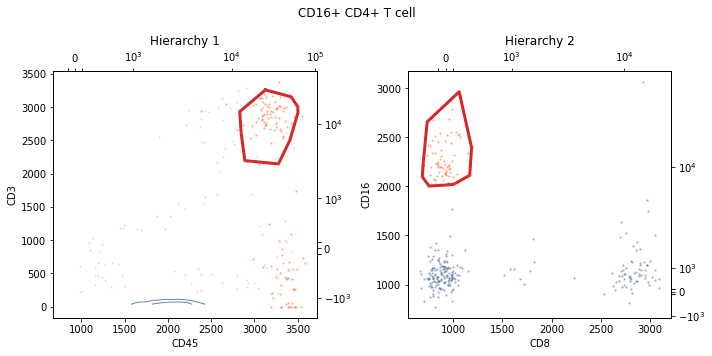

nr_targets :125
nr_non_targets :1875
nr_targets :75
nr_non_targets :224


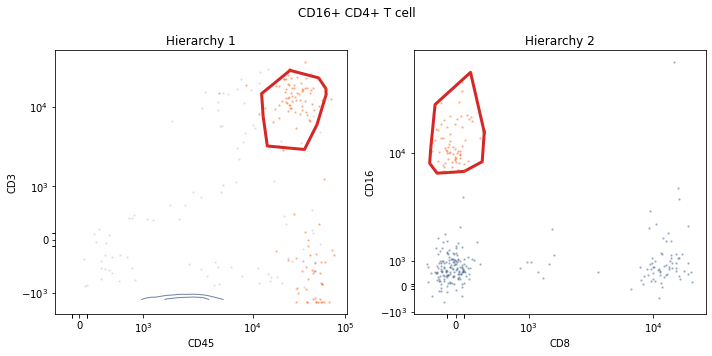

In [34]:
#read performance summary to obtain number of clusters
num_hierarchies = 2
scen = 'full'
run_ID =0
for mode in ['both', 'replace']:
    path = os.path.join(add_hull_path, scen, population)
    save = os.path.join(add_hull_path, scen, population,
                    population + f'_gating_strategy_{mode}.pdf')
    save_png = os.path.join(add_hull_path, scen, population, 
                            population + f'_gating_strategy_{mode}.png')
    if not os.path.exists(path):
            os.makedirs(path)
    contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                            mode=mode, transform_func=lut_func, 
                                    inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

#### Reduced panel

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.195171     0.767773     0.778846     0.776699     0.770732
recall        0.776000     0.648000     0.648000     0.640000     0.632000
precision     0.111623     0.941860     0.975904     0.987654     0.987500


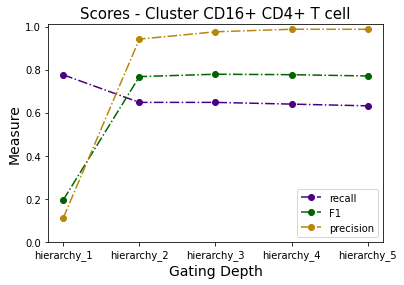

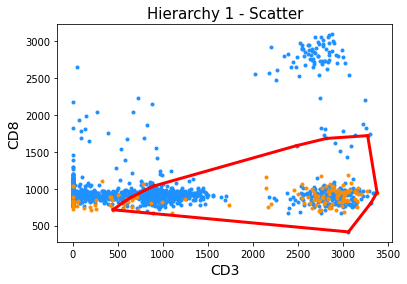

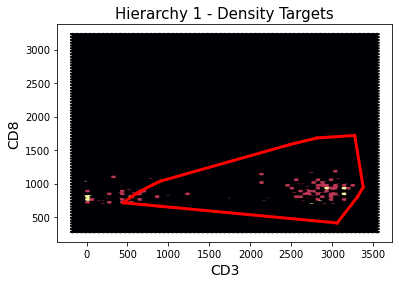

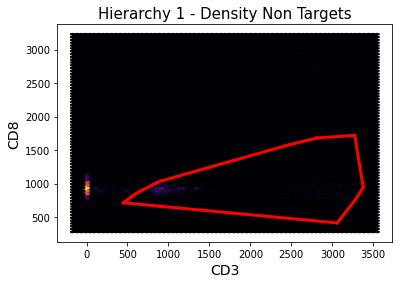

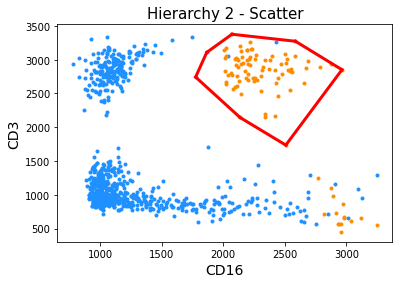

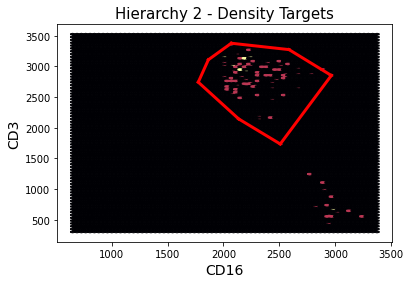

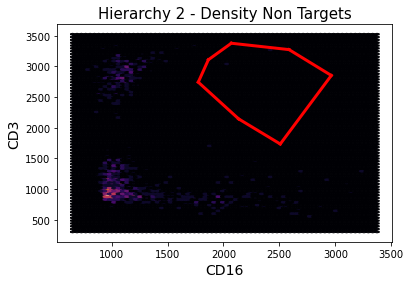

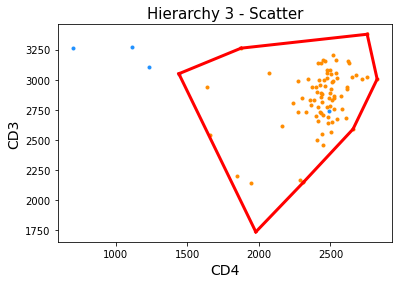

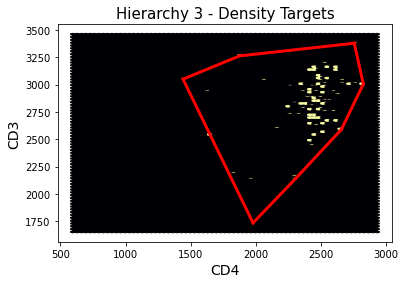

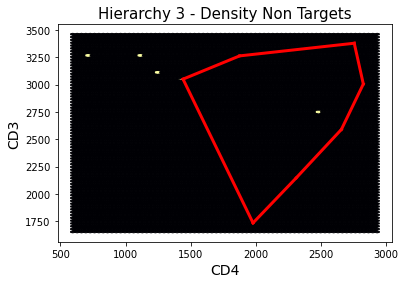

In [61]:
group = ['CD16+ CD4+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['CD3','CD4','CD8','CD16']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )
meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd4_reduced.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

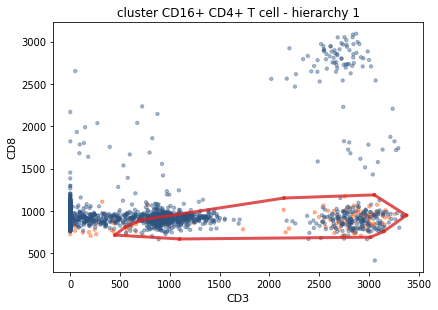

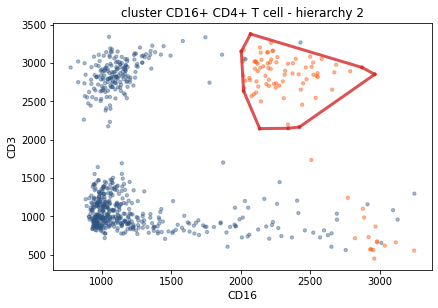

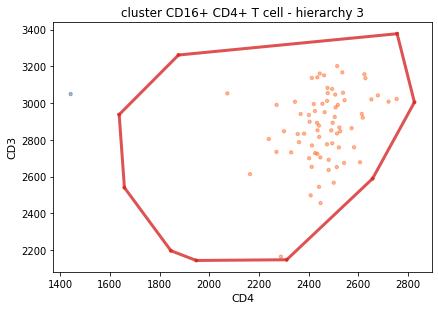

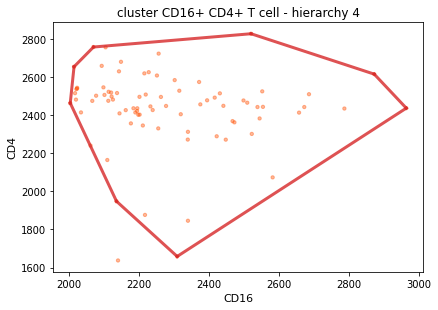

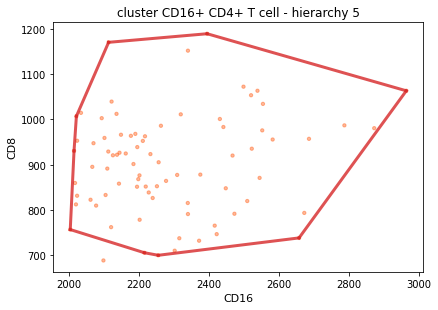

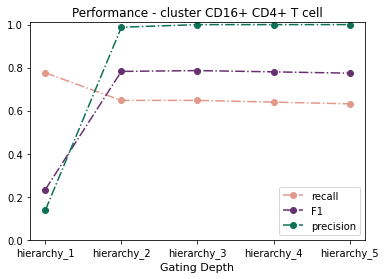

In [62]:
meta_info_path = os.path.join(save_path, "meta_info_cd4_reduced.npy")
for key in keys:
    target_location = os.path.join(save_path, 'reduced')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

In [35]:
add_hull_path = os.path.join('./../', 'data', 'FACS_COVID_LB','cg_lvl3')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


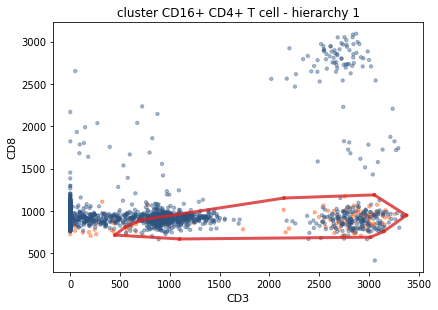

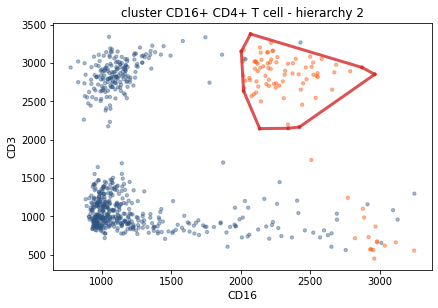

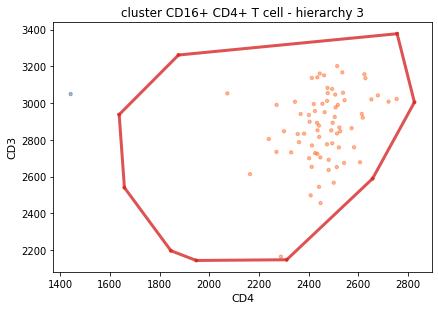

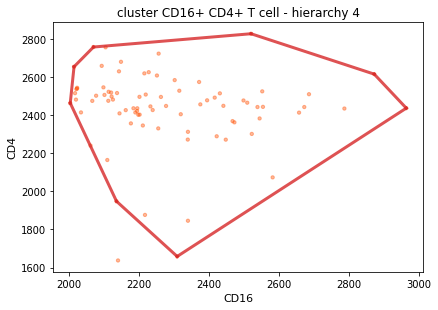

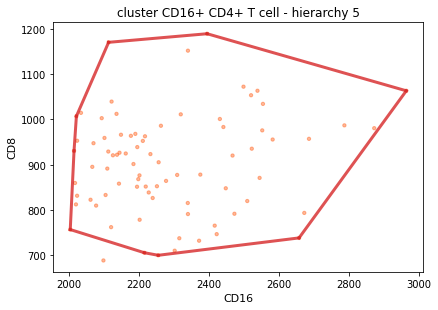

In [36]:
meta_info_path = os.path.join(add_hull_path, "meta_info_cd4_reduced.npy")
meta_info = np.load(meta_info_path,allow_pickle=True).item()
population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)

nr_targets :125
nr_non_targets :1875
nr_targets :97
nr_non_targets :608


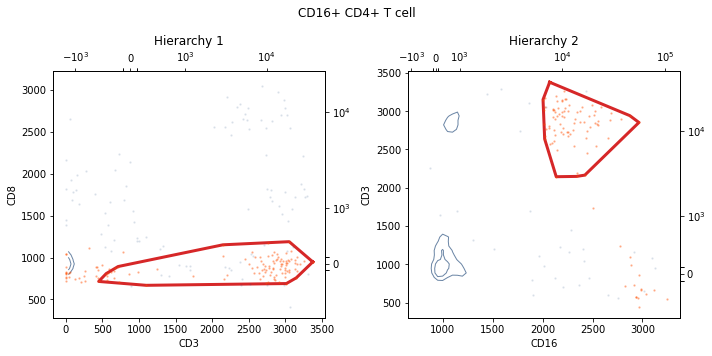

nr_targets :125
nr_non_targets :1875
nr_targets :97
nr_non_targets :608


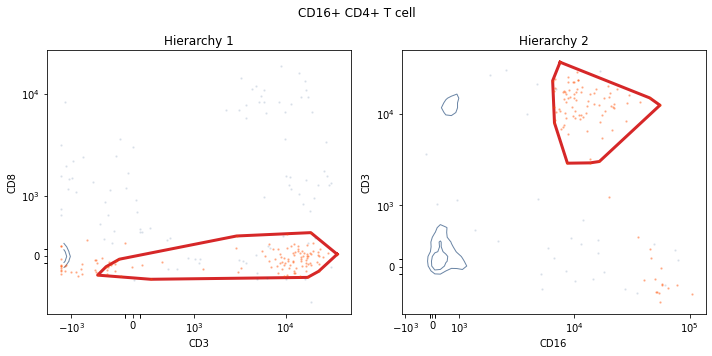

In [37]:
#read performance summary to obtain number of clusters
num_hierarchies = 2
scen = 'reduced'
run_ID =0
for mode in ['both', 'replace']:
    path = os.path.join(add_hull_path, scen, population)
    save = os.path.join(add_hull_path, scen, population,
                    population + f'_gating_strategy_{mode}.pdf')
    save_png = os.path.join(add_hull_path, scen, population, 
                            population + f'_gating_strategy_{mode}.png')
    if not os.path.exists(path):
            os.makedirs(path)
    contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                            mode=mode, transform_func=lut_func, 
                                    inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

#### Five marker panel

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.410127     0.770732         0.75     0.730964      0.72449
recall        0.648000     0.632000         0.60     0.576000      0.56800
precision     0.300000     0.987500         1.00     1.000000      1.00000


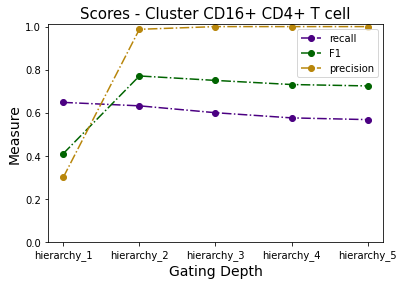

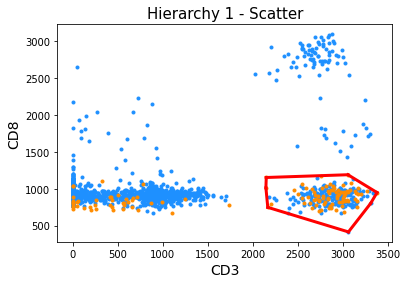

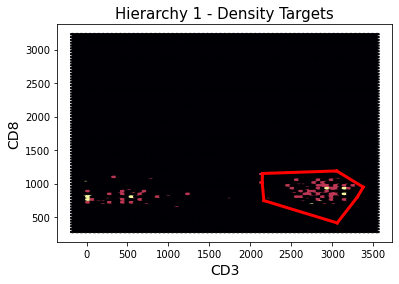

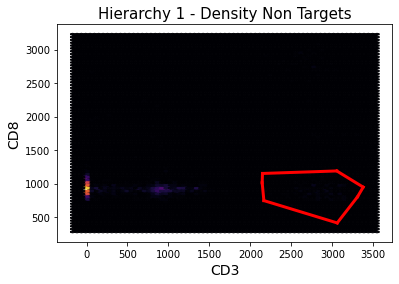

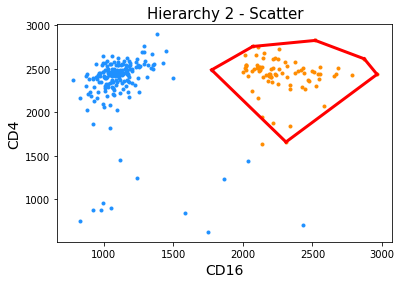

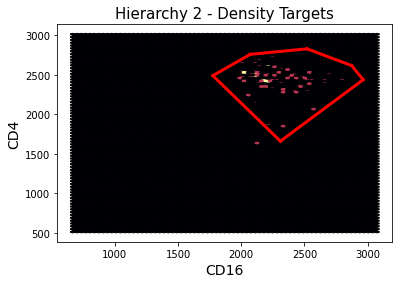

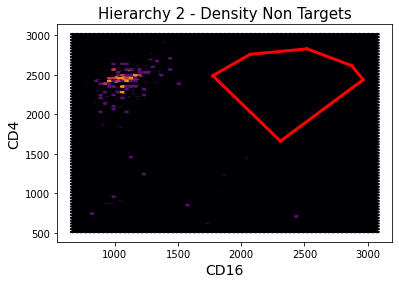

In [23]:
group = ['CD16+ CD4+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['HLA-DR', 'CD3','CD4','CD8','CD16']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )
meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd4_reduced_5marker.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

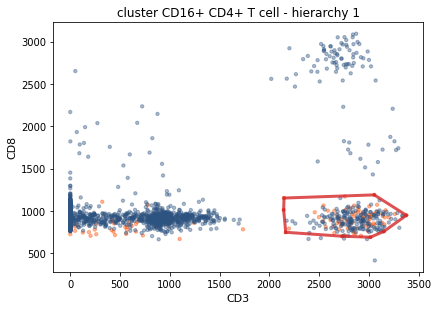

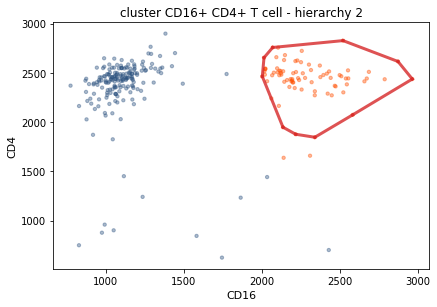

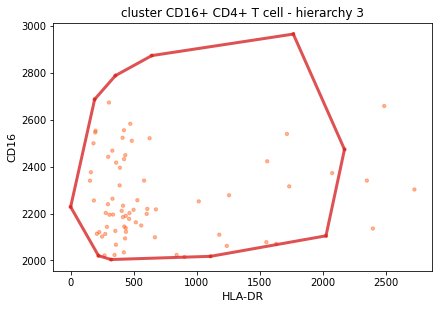

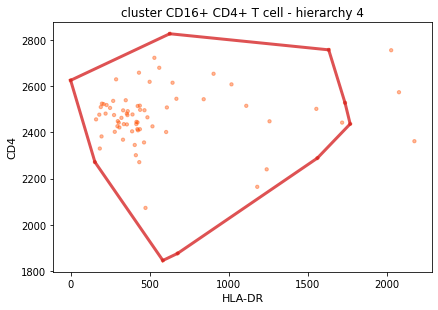

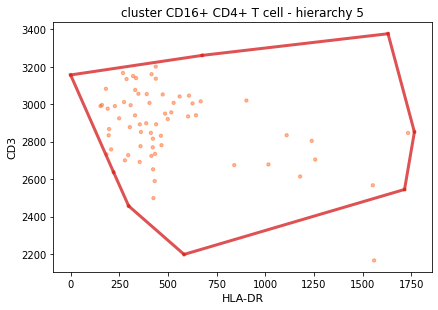

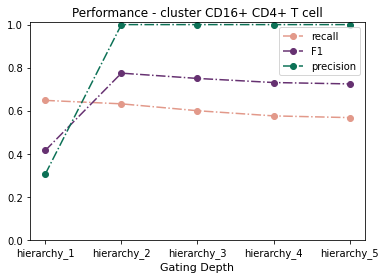

In [24]:
meta_info_path = os.path.join(save_path, "meta_info_cd4_reduced_5marker.npy")
for key in keys:
    target_location = os.path.join(save_path, 'reduced_5marker')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

In [35]:
add_hull_path = os.path.join('./../', 'data', 'FACS_COVID_LB','cg_lvl3')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


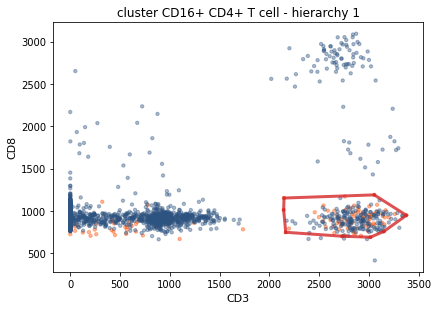

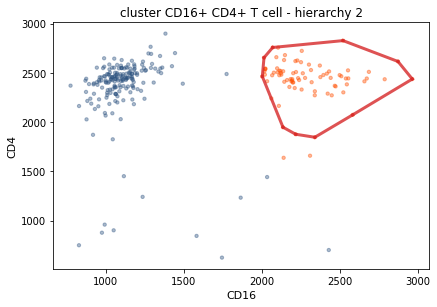

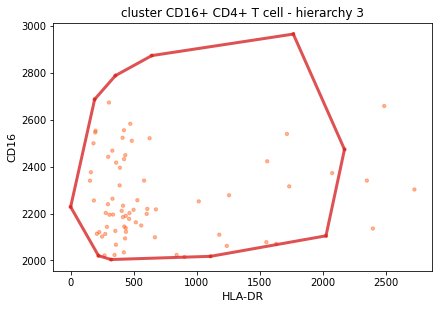

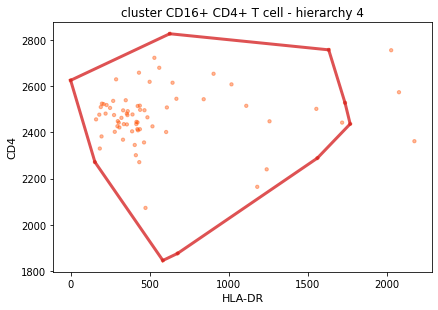

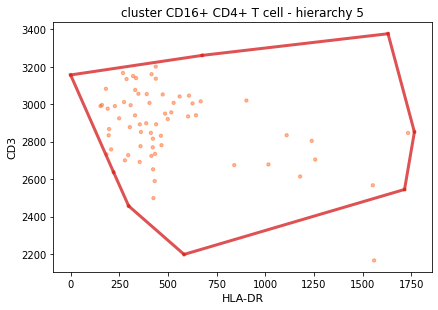

In [38]:
meta_info_path = os.path.join(add_hull_path, "meta_info_cd4_reduced_5marker.npy")
meta_info = np.load(meta_info_path,allow_pickle=True).item()
population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)

nr_targets :125
nr_non_targets :1875
nr_targets :81
nr_non_targets :184


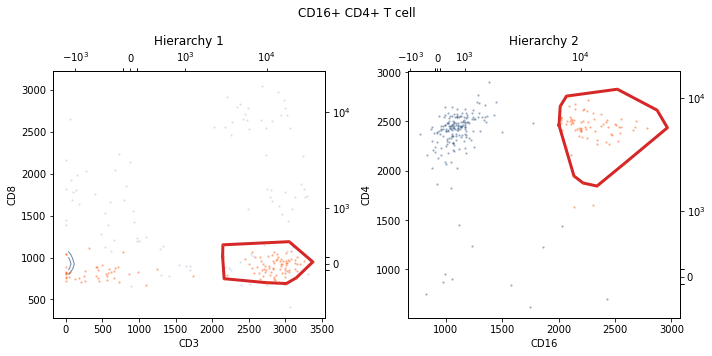

nr_targets :125
nr_non_targets :1875
nr_targets :81
nr_non_targets :184


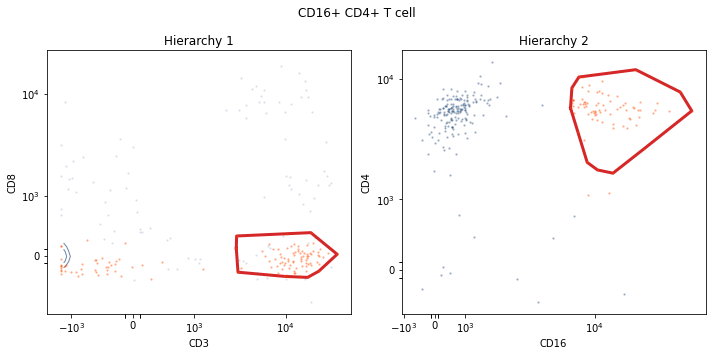

In [39]:
#read performance summary to obtain number of clusters
num_hierarchies = 2
scen = 'reduced_5marker'
run_ID =0
for mode in ['both', 'replace']:
    path = os.path.join(add_hull_path, scen, population)
    save = os.path.join(add_hull_path, scen, population,
                    population + f'_gating_strategy_{mode}.pdf')
    save_png = os.path.join(add_hull_path, scen, population, 
                            population + f'_gating_strategy_{mode}.png')
    if not os.path.exists(path):
            os.makedirs(path)
    contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                            mode=mode, transform_func=lut_func, 
                                    inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

#### CITEseq panel

From the CITEseq data, we have the following markers for the CD16+ CD8+ T cells: CD3, CD8, CD16, CD1d. 
For the CD16+ CD4+ T cells, we have the following markers: CD3, CD4, CD16, CEACAM8 (aka CD66b). 
However, CD1d is not part of this panel, so we would have to restrict to three markers. Also, this panel neglects the rare CD16+ CD4+ T cells, which would not be separated then. We therefore could set up a minimal panel as CD3, CD4, CD8, CD16, CD66b.

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4
f1            0.273224     0.722543     0.761905      0.77451
recall        1.000000     1.000000     0.704000      0.63200
precision     0.158228     0.565611     0.830189      1.00000


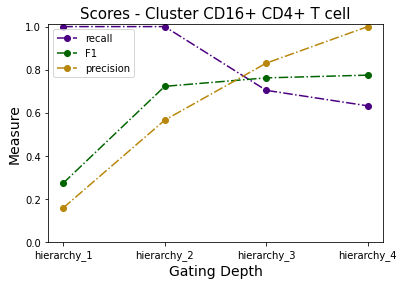

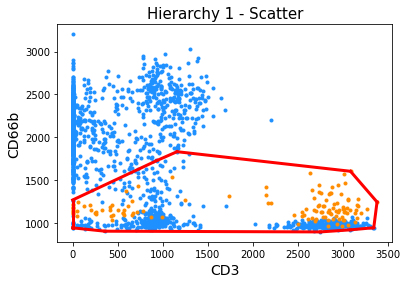

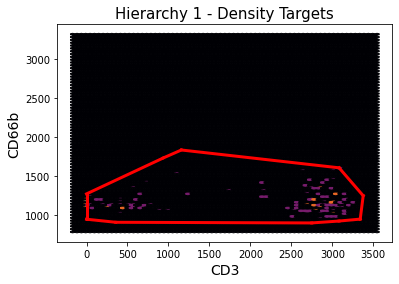

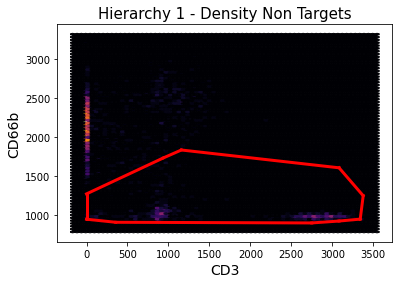

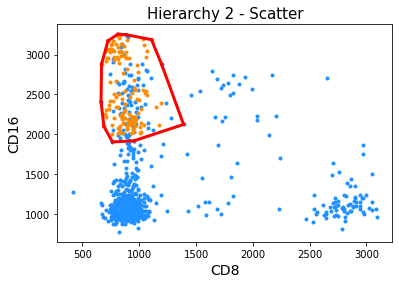

...

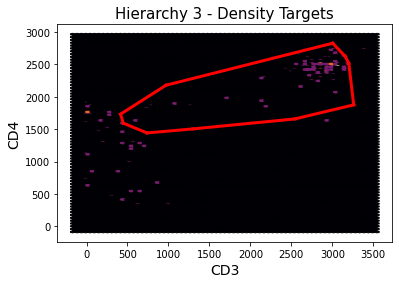

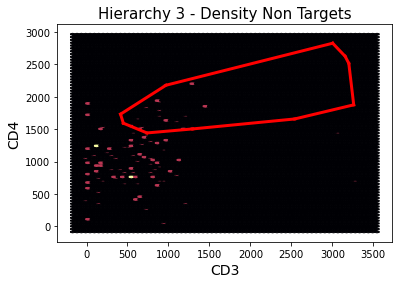

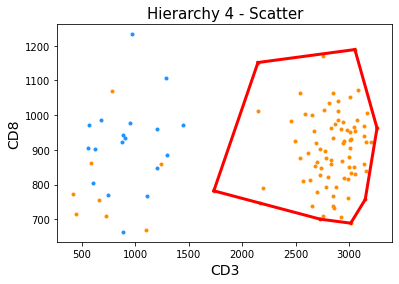

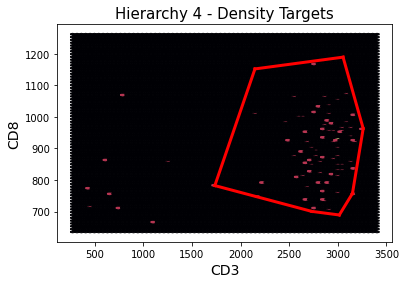

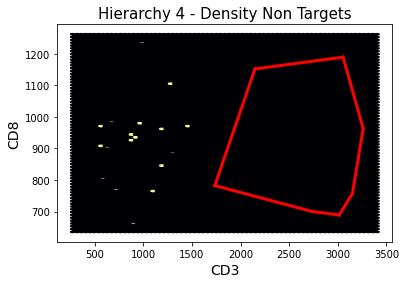

In [63]:
group = ['CD16+ CD4+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['CD3','CD4','CD8','CD16', 'CD66b']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )

meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd4_jointciteseq.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

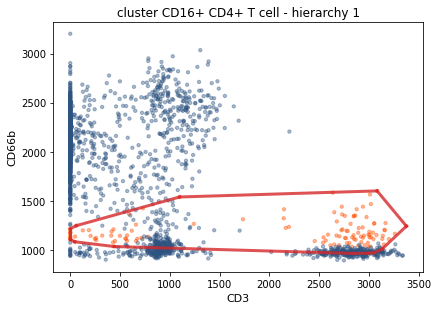

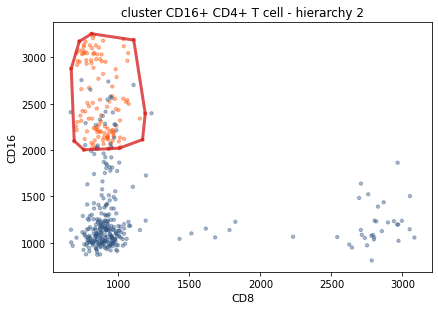

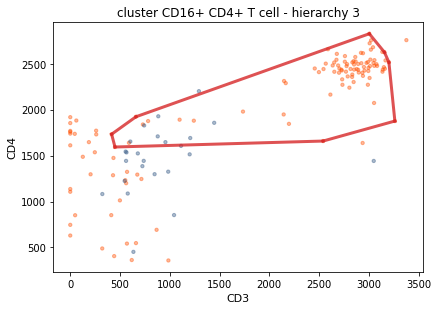

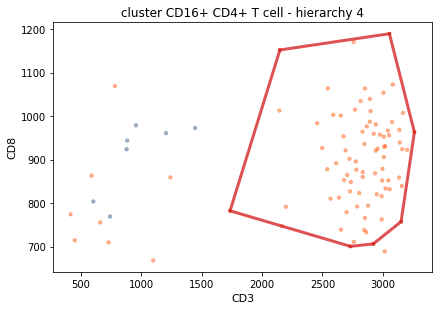

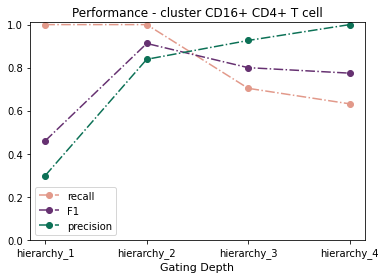

In [64]:
meta_info_path = os.path.join(save_path, "meta_info_cd4_jointciteseq.npy")
for key in keys:
    target_location = os.path.join(save_path, 'citeseq')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

#### cyTOF panel

From the cyTOF data, we have the following markers for the CD16+ CD8+ T cells: CD3, CD8, CD16, CD1d; and for the CD16+ CD4+ T cells, we have: CD3, CD4, CD10, CD14, CD15, CD16. From these markers, the following are available in the FACS panel: CD3, CD4, CD14, CD16. The resulting transferred panel would then consist of CD3, CD4, CD8, CD14, CD16.

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.359281     0.581006     0.576271     0.568182        0.560
recall        0.480000     0.416000     0.408000     0.400000        0.392
precision     0.287081     0.962963     0.980769     0.980392        0.980


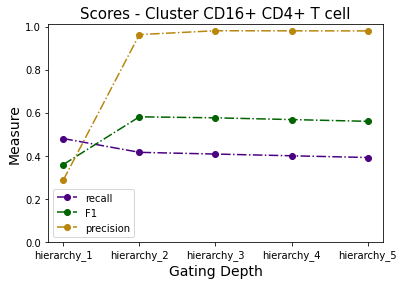

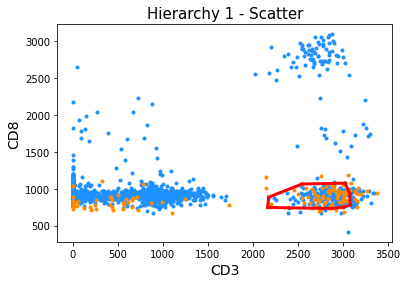

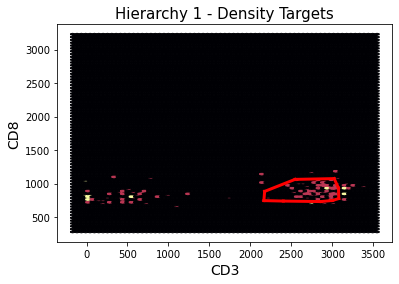

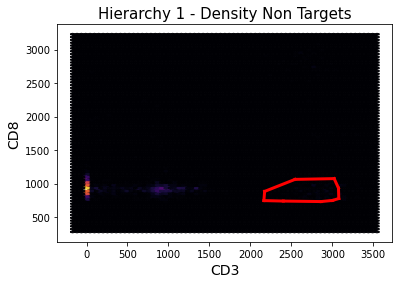

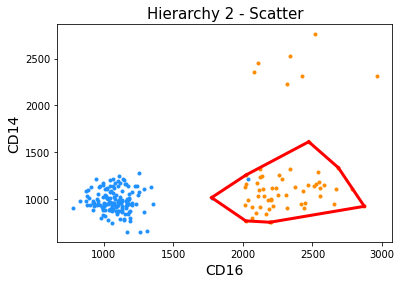

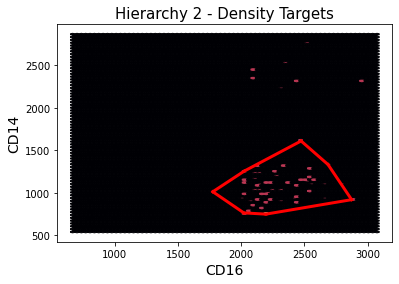

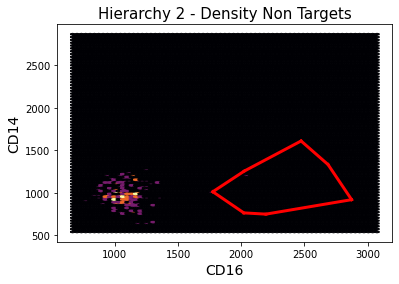

In [65]:
group = ['CD16+ CD4+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['CD3','CD4','CD8','CD14','CD16']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )

meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd4_jointcytof.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

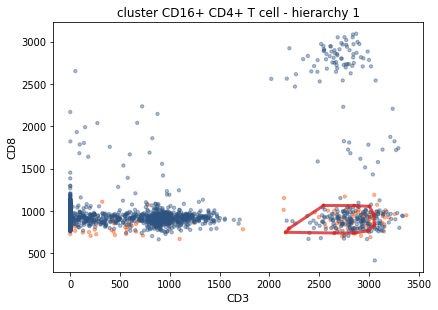

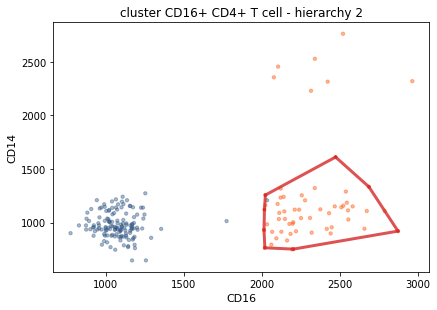

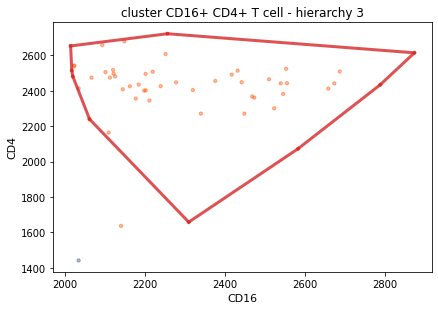

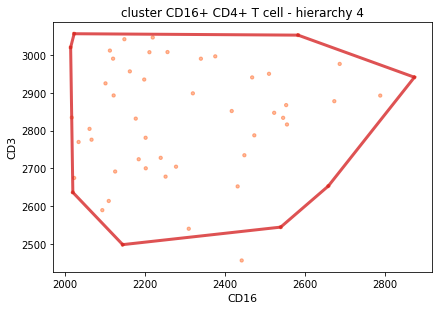

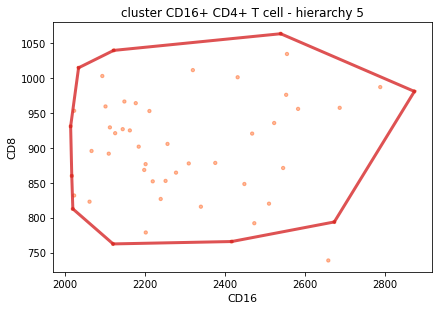

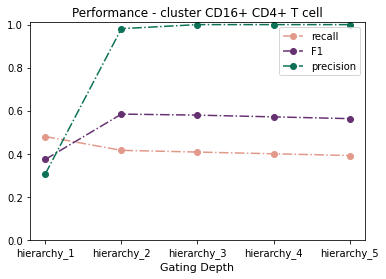

In [66]:
meta_info_path = os.path.join(save_path, "meta_info_cd4_jointcytof.npy")
for key in keys:
    target_location = os.path.join(save_path, 'cytof')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

### CD16+ CD8+ T cells

Enrich for target population.

In [25]:
target_mask = adata_covid.obs['manual cell type lvl 3']=='CD16+ CD8+ T cell'
adata_target = adata_covid[target_mask].copy()
adata_nontarget = adata_covid[~target_mask].copy()

In [26]:
adata_target.n_obs 

5126

In [27]:
adata_nontarget.n_obs

3710931

In [28]:
sc.pp.subsample(adata_nontarget, n_obs = adata_target.n_obs * 15)

Merge both target and non-target populations.

In [29]:
adata_full = ann.AnnData.concatenate(*[adata_target, adata_nontarget], index_unique=None)

In [30]:
adata_full

AnnData object with n_obs × n_vars = 82016 × 15
    obs: 'FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'Time', 'sample', 'sample_ID', 'donor_initials', 'exp_date', 'status_max', 'status_exp_date', 'control', 'WHO_classification', 'WHO_max', 'days_post_symptoms', 'exclusion', 'time_point', 'merged_anno', 'total_wbc_count', 'comments', 'bad_HLA-DR', 'gate_root', 'gate_Cells', 'gate_Cells-Single Cells', 'gate_Single Cells-Single Cells', 'gate_live', 'gate_CD45+', 'gate_Granulocytes', 'gate_Eosinophils', 'gate_Neutrophils', 'gate_Q2: CD16+ , Siglec8+', 'gate_Q4: CD16- , Siglec8-', 'gate_PBMC', 'gate_B cells', 'gate_CD3+', 'gate_NKT', 'gate_CD3+-others', 'gate_CD4 T cells', 'gate_CD8 T cells', 'gate_PBMC-others', 'gate_NK cells', 'gate_others-others', 'gate_monocytes', 'gate_CD16 mono', 'gate_classical', 'gate_HLA-DR, CD11c subset', 'gate_intermediate', 'gate_Q4: CD16- , CD14-', 'batch', 'covid_status', 'manual cell type lvl 1', 'manual cell type lvl 2', 'manual cell type lvl 3'
   

Subsample to 50,000 cells.

In [31]:
sc.pp.subsample(adata_full, n_obs=50000)

In [32]:
import convexgating as cg
import os

#### Full panel

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.762132     0.888733     0.889161     0.889278     0.887524
recall        0.810159     0.806349     0.806032     0.805714     0.802857
precision     0.719481     0.989867     0.991410     0.992181     0.992154


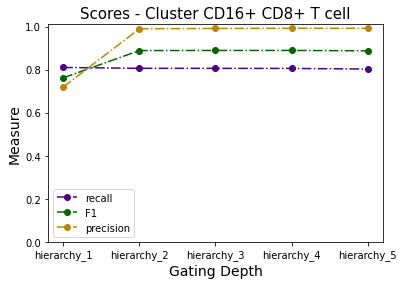

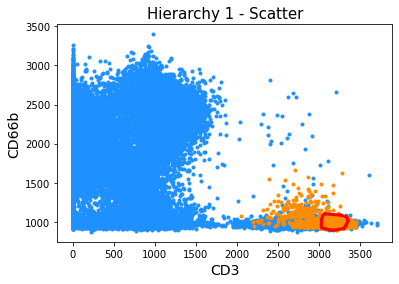

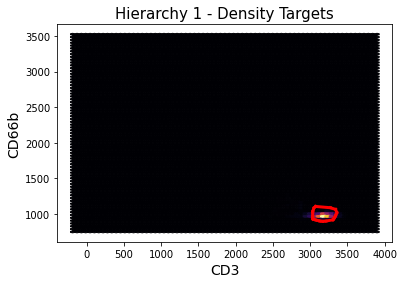

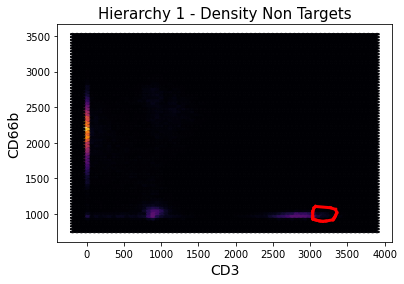

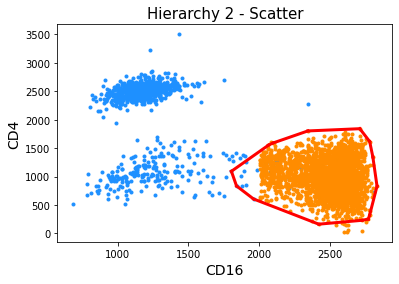

...

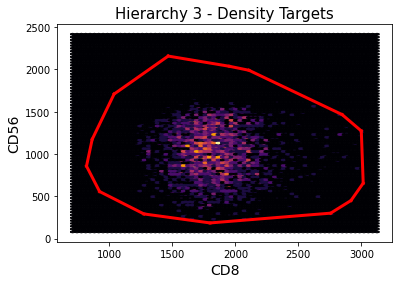

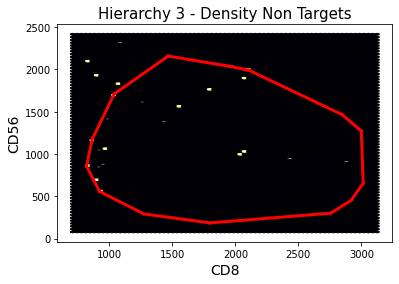

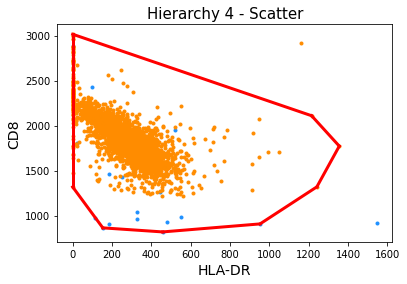

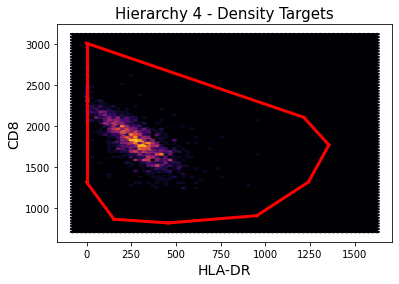

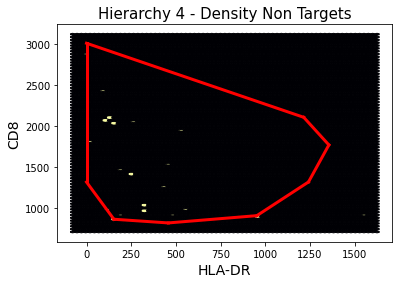

In [75]:
group = ['CD16+ CD8+ T cell'] #
cluster_string = 'manual cell type lvl 3'
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = list(adata_full.var.index),
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )

meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd8_full.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

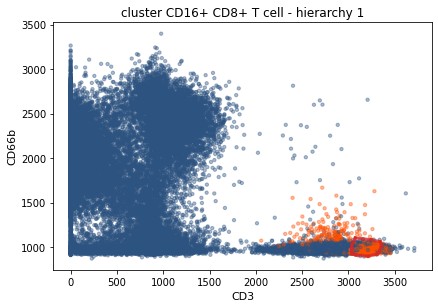

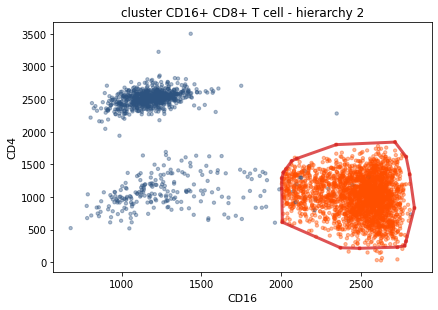

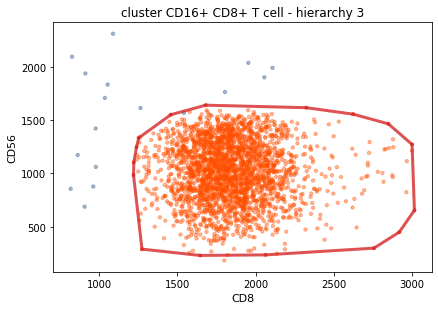

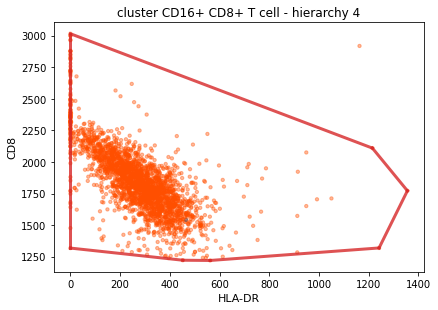

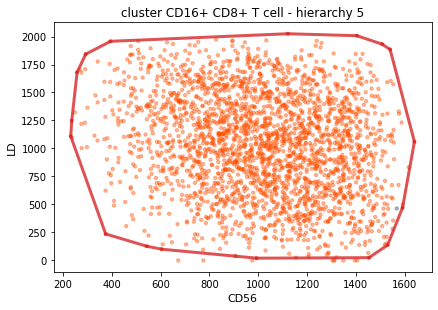

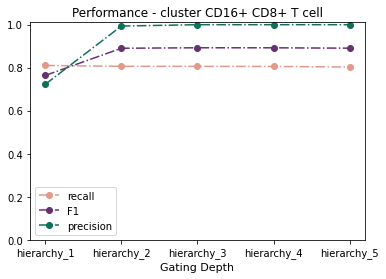

In [76]:
meta_info_path = os.path.join(save_path, "meta_info_cd8_full.npy")
for key in keys:
    target_location = os.path.join(save_path, 'full')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

In [40]:
add_hull_path = os.path.join('./../', 'data', 'FACS_COVID_LB','cg_lvl3')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


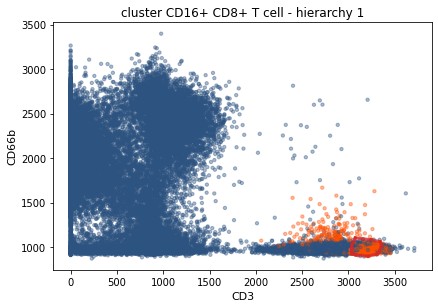

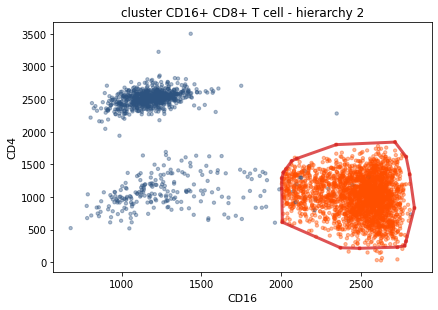

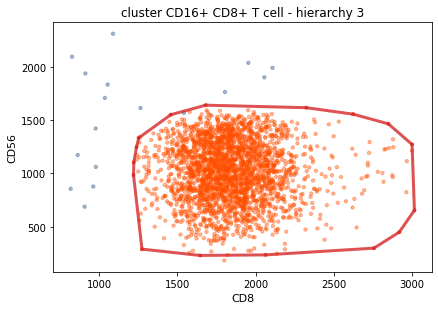

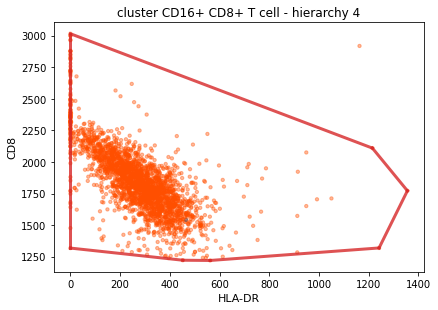

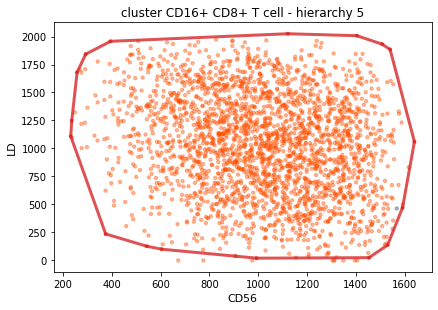

In [41]:
meta_info_path = os.path.join(add_hull_path, "meta_info_cd8_full.npy")
meta_info = np.load(meta_info_path,allow_pickle=True).item()
population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)

nr_targets :3150
nr_non_targets :46850
nr_targets :2552
nr_non_targets :979


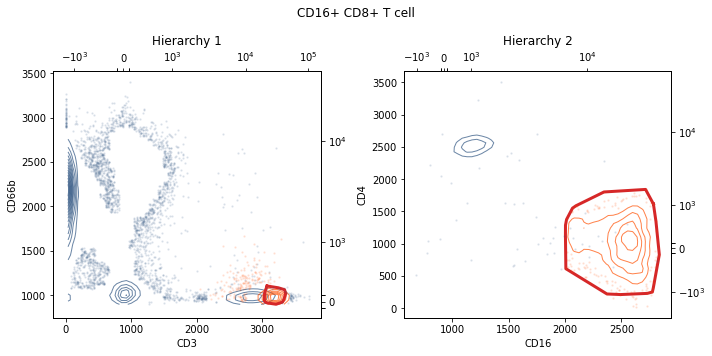

nr_targets :3150
nr_non_targets :46850
nr_targets :2552
nr_non_targets :979


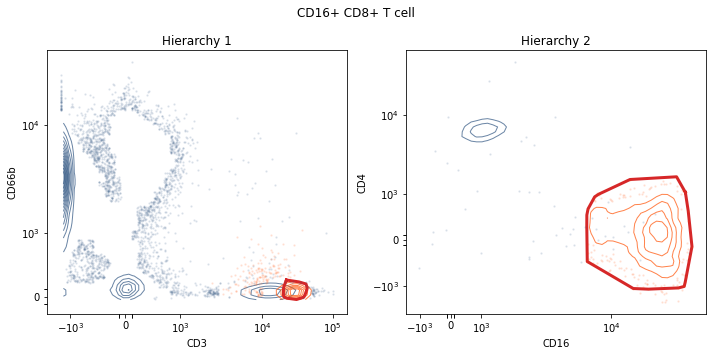

In [42]:
#read performance summary to obtain number of clusters
num_hierarchies = 2
scen = 'full'
run_ID =0
for mode in ['both', 'replace']:
    path = os.path.join(add_hull_path, scen, population)
    save = os.path.join(add_hull_path, scen, population,
                    population + f'_gating_strategy_{mode}.pdf')
    save_png = os.path.join(add_hull_path, scen, population, 
                            population + f'_gating_strategy_{mode}.png')
    if not os.path.exists(path):
            os.makedirs(path)
    contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                            mode=mode, transform_func=lut_func, 
                                    inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

#### Reduced panel

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.986629     0.988466     0.989247     0.989247     0.989244
recall        0.995556     0.993016     0.993016     0.993016     0.992698
precision     0.977861     0.983957     0.985507     0.985507     0.985813


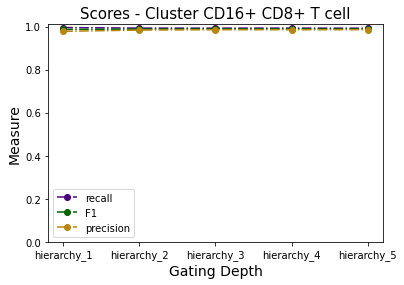

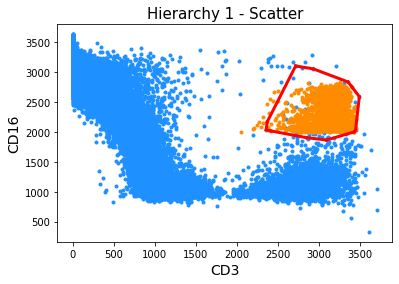

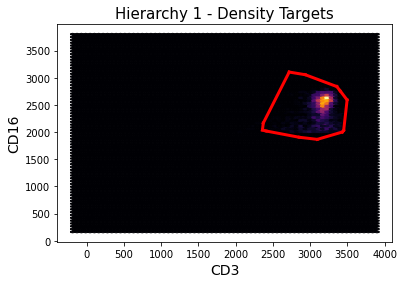

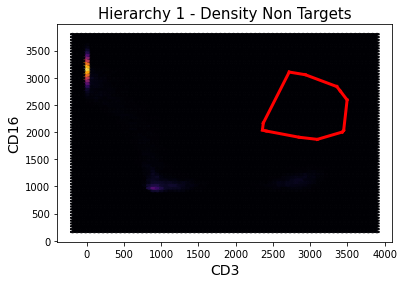

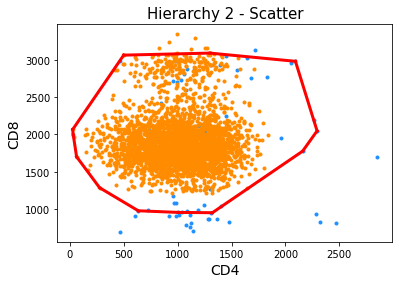

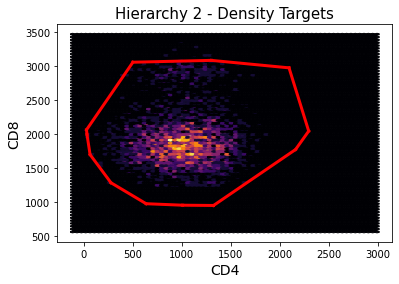

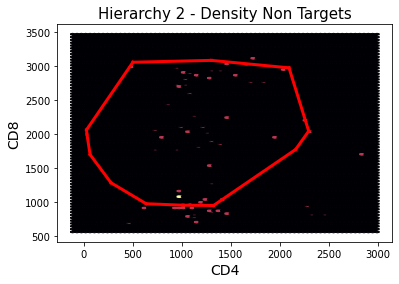

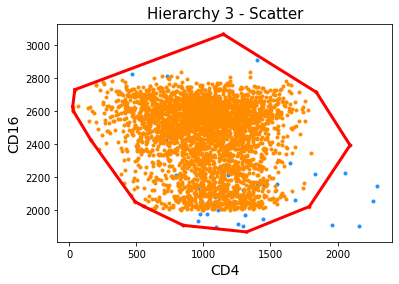

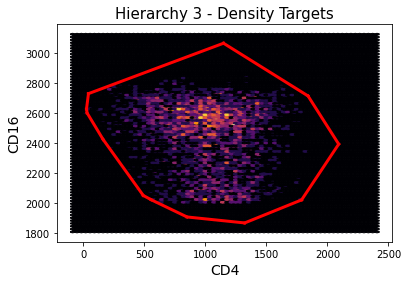

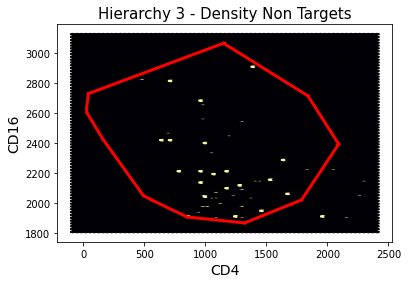

In [77]:
group = ['CD16+ CD8+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['CD3','CD4','CD8','CD16']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )
meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd8_reduced.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

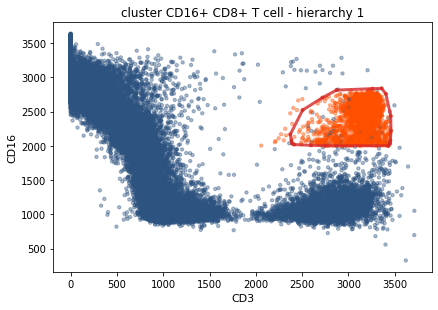

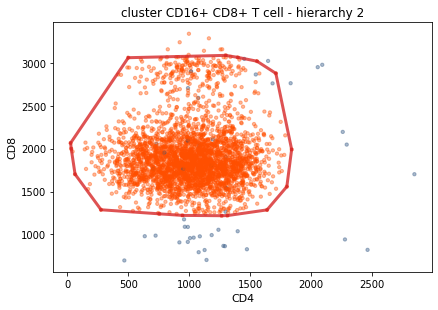

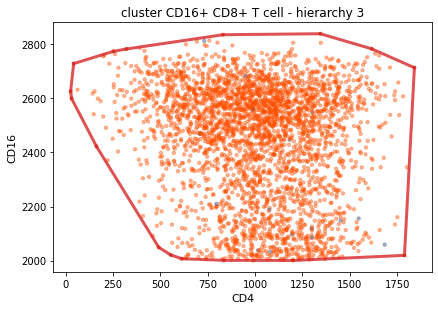

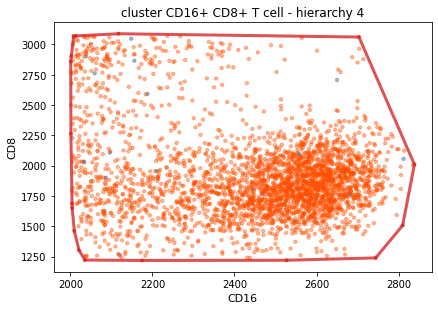

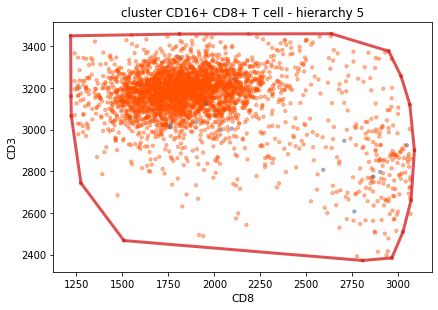

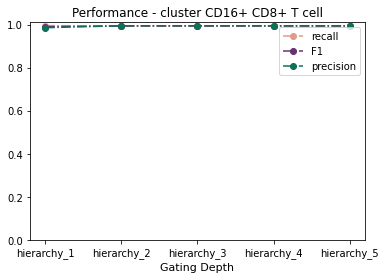

In [78]:
meta_info_path = os.path.join(save_path, "meta_info_cd8_reduced.npy")
for key in keys:
    target_location = os.path.join(save_path, 'reduced')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

In [35]:
add_hull_path = os.path.join('./../', 'data', 'FACS_COVID_LB','cg_lvl3')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


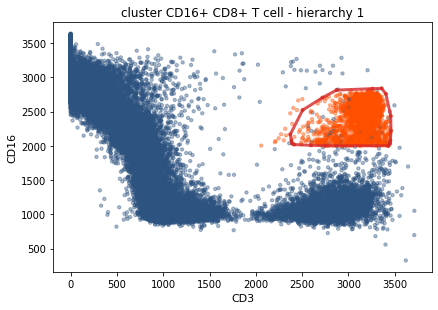

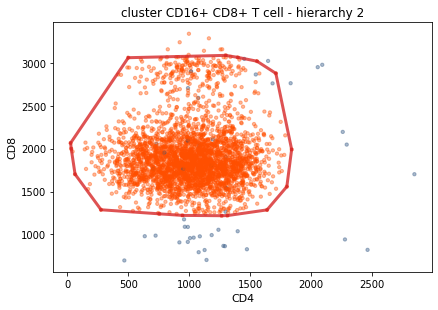

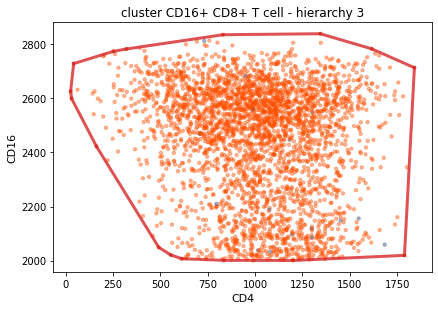

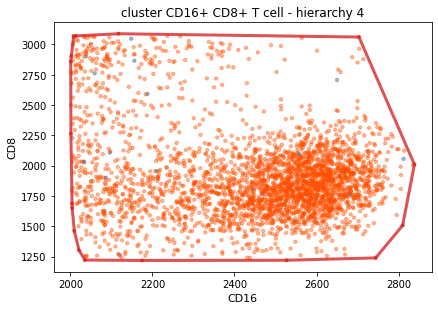

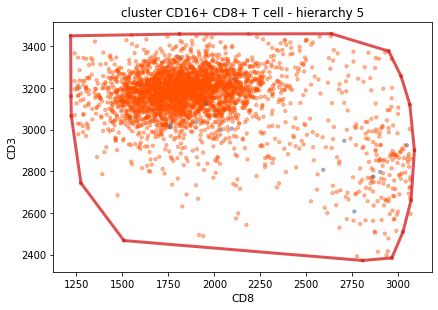

In [43]:
meta_info_path = os.path.join(add_hull_path, "meta_info_cd8_reduced.npy")
meta_info = np.load(meta_info_path,allow_pickle=True).item()
population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)

nr_targets :3150
nr_non_targets :46850
nr_targets :3136
nr_non_targets :46


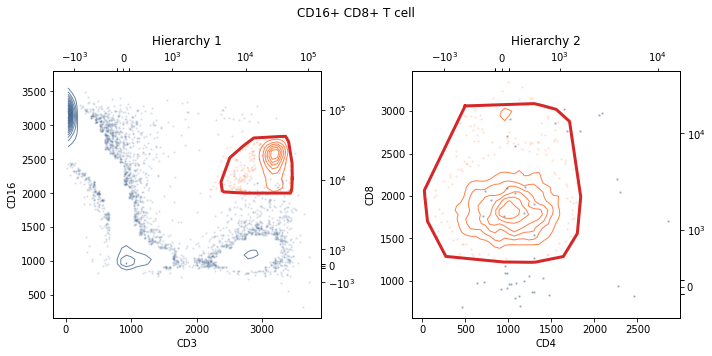

nr_targets :3150
nr_non_targets :46850
nr_targets :3136
nr_non_targets :46


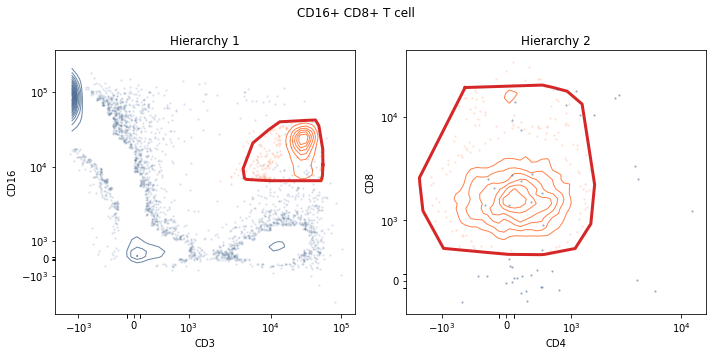

In [44]:
#read performance summary to obtain number of clusters
num_hierarchies = 2
scen = 'reduced'
run_ID =0
for mode in ['both', 'replace']:
    path = os.path.join(add_hull_path, scen, population)
    save = os.path.join(add_hull_path, scen, population,
                    population + f'_gating_strategy_{mode}.pdf')
    save_png = os.path.join(add_hull_path, scen, population, 
                            population + f'_gating_strategy_{mode}.png')
    if not os.path.exists(path):
            os.makedirs(path)
    contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                            mode=mode, transform_func=lut_func, 
                                    inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

#### Five marker panel

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.672804     0.903259     0.904819     0.904630     0.904630
recall        0.835238     0.831429     0.831429     0.831111     0.831111
precision     0.563263     0.988675     0.992421     0.992418     0.992418


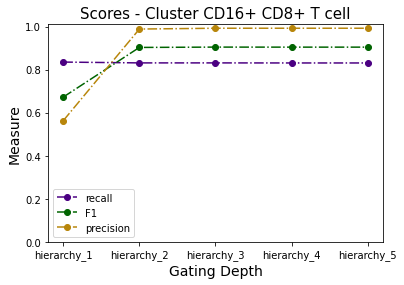

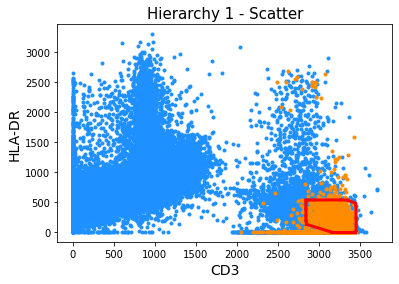

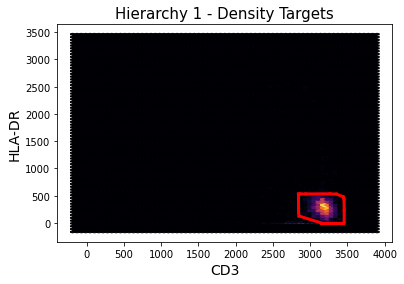

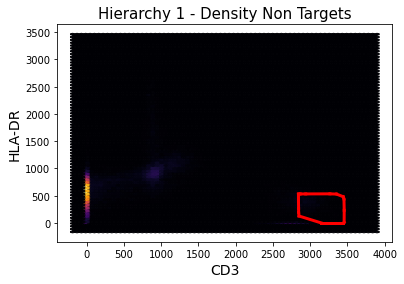

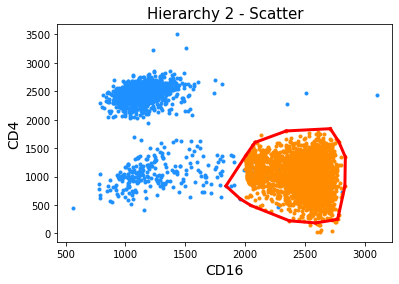

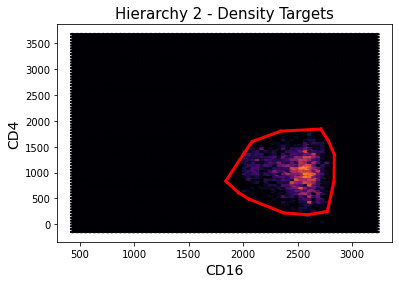

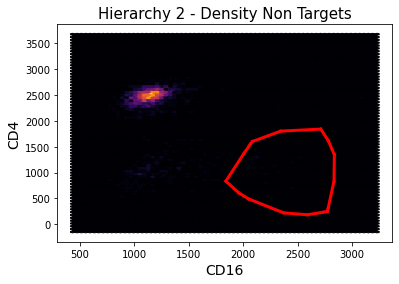

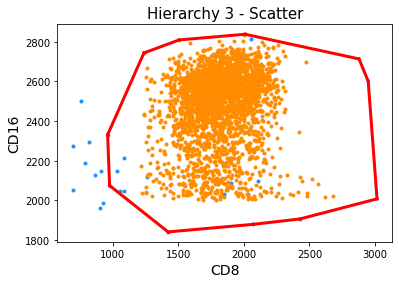

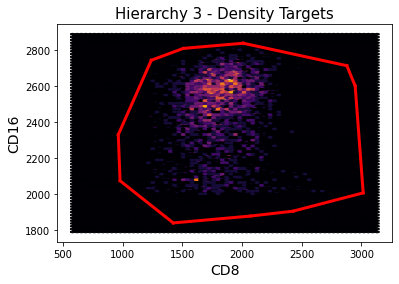

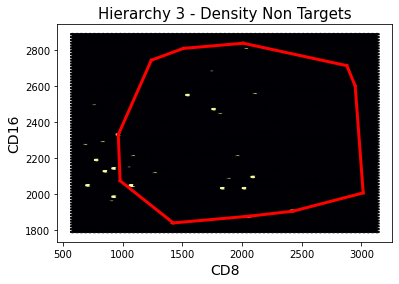

In [33]:
group = ['CD16+ CD8+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['HLA-DR','CD3','CD4','CD8','CD16']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )
meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd8_reduced_5marker.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

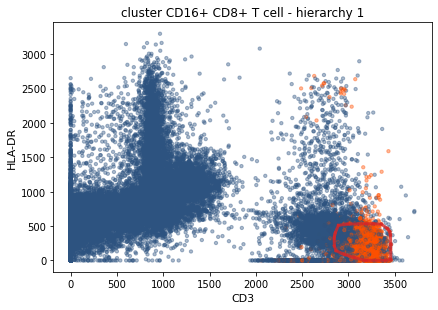

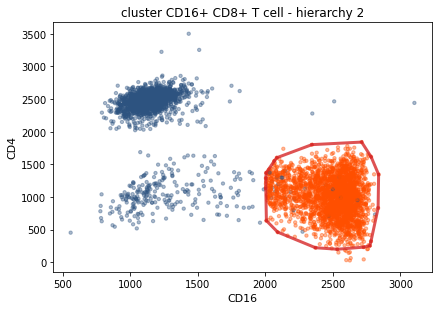

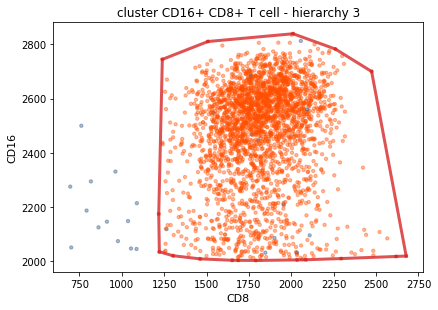

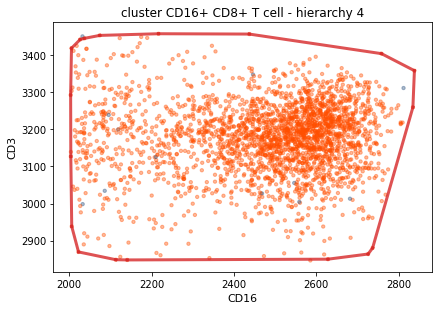

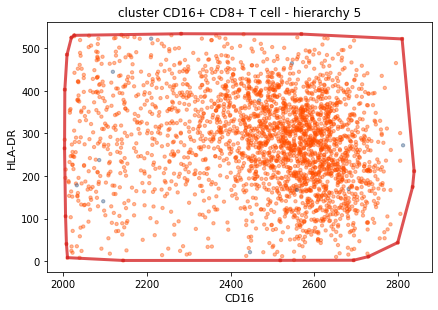

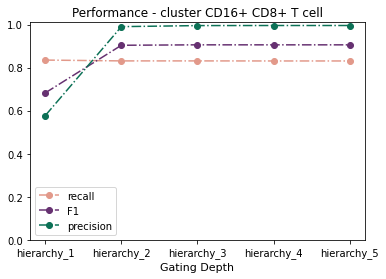

In [34]:
meta_info_path = os.path.join(save_path, "meta_info_cd8_reduced_5marker.npy")
for key in keys:
    target_location = os.path.join(save_path, 'reduced_5marker')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

In [35]:
add_hull_path = os.path.join('./../', 'data', 'FACS_COVID_LB','cg_lvl3')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


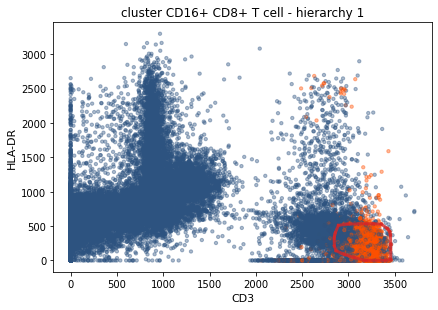

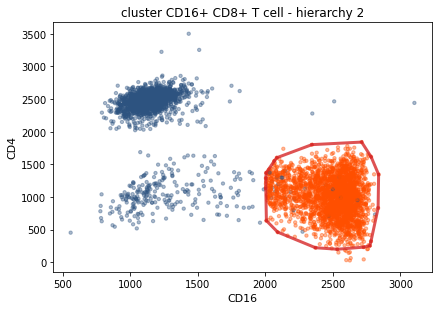

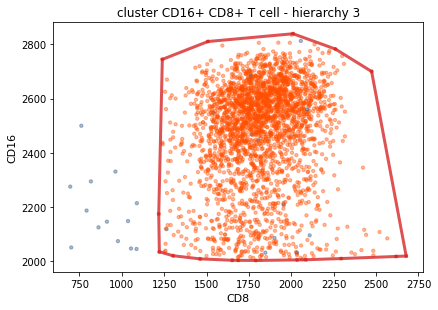

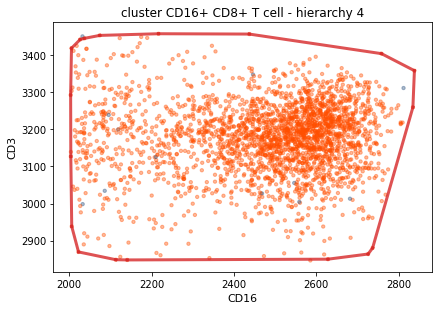

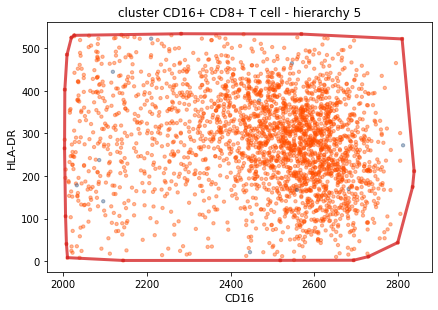

In [45]:
meta_info_path = os.path.join(add_hull_path, "meta_info_cd8_reduced_5marker.npy")
meta_info = np.load(meta_info_path,allow_pickle=True).item()
population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)

nr_targets :3150
nr_non_targets :46850
nr_targets :2631
nr_non_targets :1924


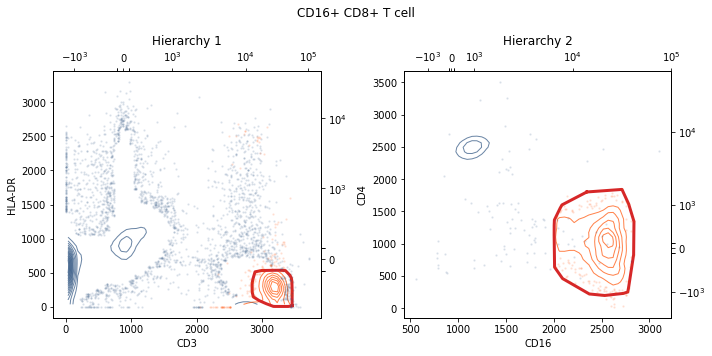

nr_targets :3150
nr_non_targets :46850
nr_targets :2631
nr_non_targets :1924


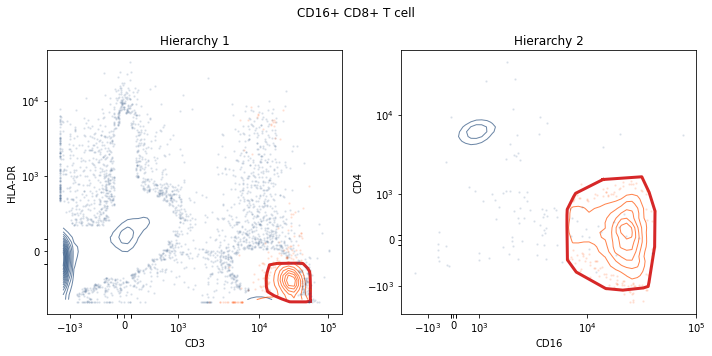

In [46]:
#read performance summary to obtain number of clusters
num_hierarchies = 2
scen = 'reduced_5marker'
run_ID =0
for mode in ['both', 'replace']:
    path = os.path.join(add_hull_path, scen, population)
    save = os.path.join(add_hull_path, scen, population,
                    population + f'_gating_strategy_{mode}.pdf')
    save_png = os.path.join(add_hull_path, scen, population, 
                            population + f'_gating_strategy_{mode}.png')
    if not os.path.exists(path):
            os.makedirs(path)
    contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                            mode=mode, transform_func=lut_func, 
                                    inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

#### CITEseq panel

From the CITEseq data, we have the following markers for the CD16+ CD8+ T cells: CD3, CD8, CD16, CD1d. 
For the CD16+ CD4+ T cells, we have the following markers: CD3, CD4, CD16, CEACAM8 (aka CD66b). 
However, CD1d is not part of this panel, so we would have to restrict to three markers. Also, this panel neglects the rare CD16+ CD4+ T cells, which would not be separated then. We therefore could set up a minimal panel as CD3, CD4, CD8, CD16, CD66b.

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.749634     0.891251     0.892501     0.892501     0.892308
recall        0.812698     0.811746     0.810476     0.810476     0.810159
precision     0.695652     0.988022     0.992999     0.992999     0.992996


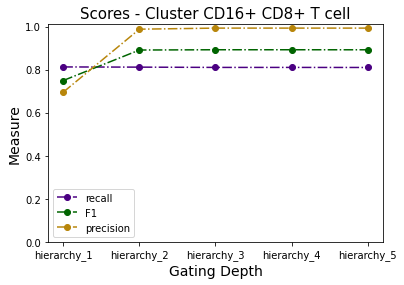

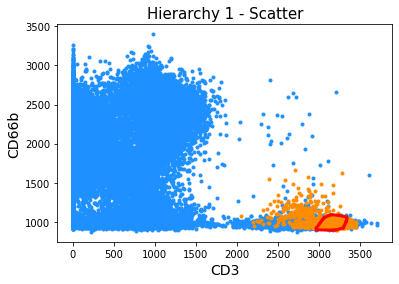

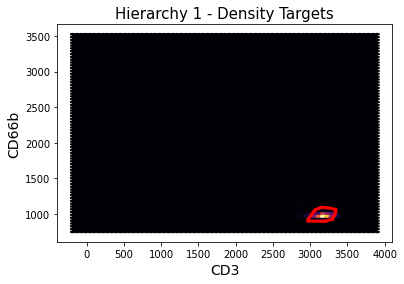

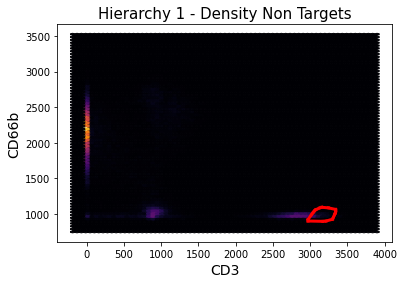

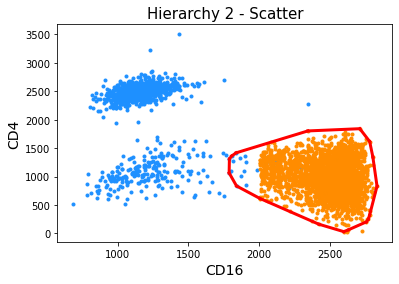

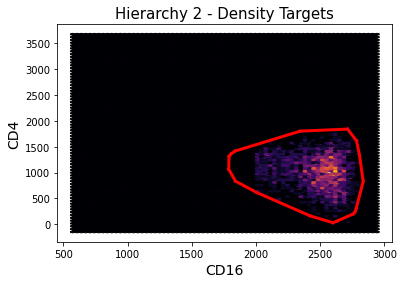

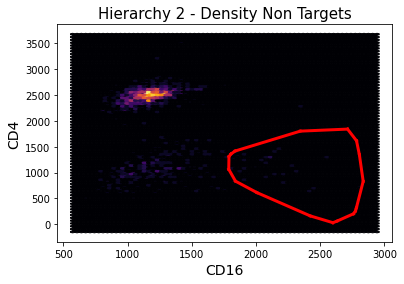

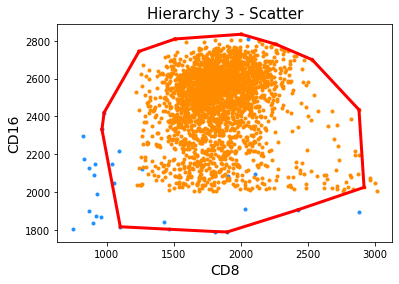

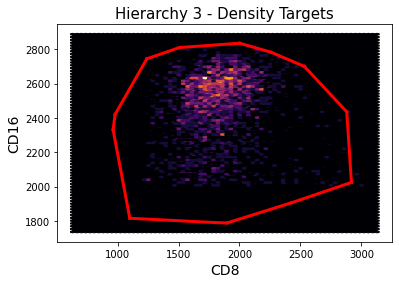

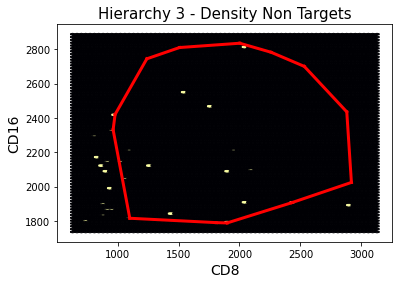

In [79]:
group = ['CD16+ CD8+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['CD3','CD4','CD8','CD16', 'CD66b']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )

meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd8_jointciteseq.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

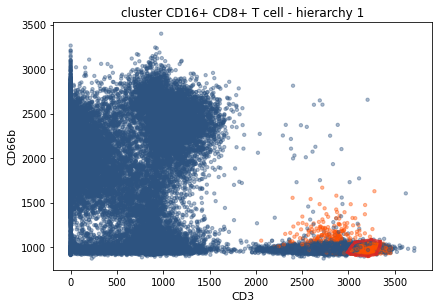

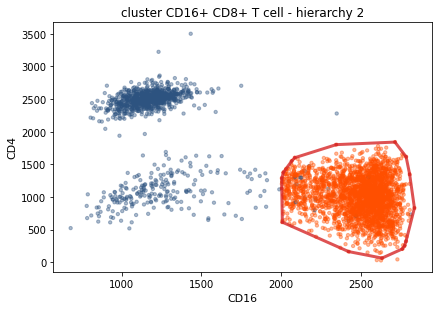

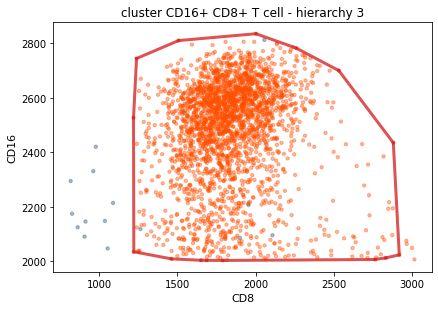

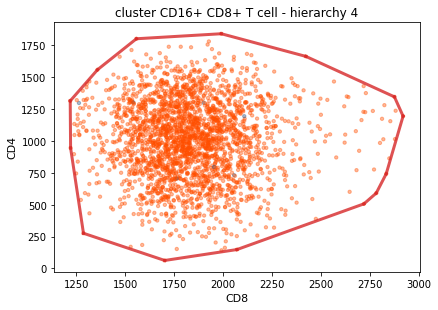

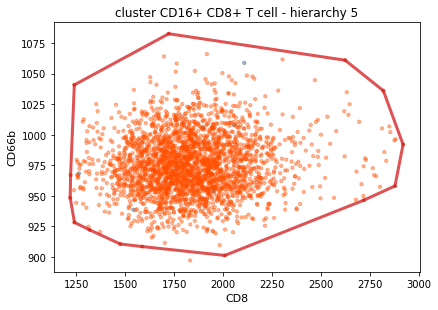

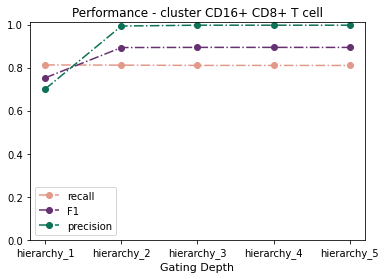

In [80]:
meta_info_path = os.path.join(save_path, "meta_info_cd8_jointciteseq.npy")
for key in keys:
    target_location = os.path.join(save_path, 'citeseq')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

#### cyTOF panel

From the cyTOF data, we have the following markers for the CD16+ CD8+ T cells: CD3, CD8, CD16, CD1d; and for the CD16+ CD4+ T cells, we have: CD3, CD4, CD10, CD14, CD15, CD16. From these markers, the following are available in the FACS panel: CD3, CD4, CD14, CD16. The resulting transferred panel would then consist of CD3, CD4, CD8, CD14, CD16.

           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.986919     0.988626     0.986671     0.986510     0.986510
recall        0.993968     0.993333     0.986984     0.986667     0.986667
precision     0.979969     0.983962     0.986358     0.986354     0.986354


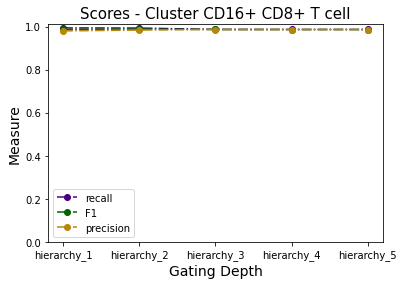

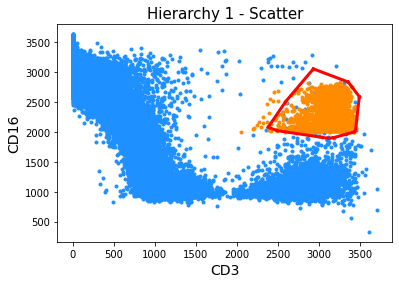

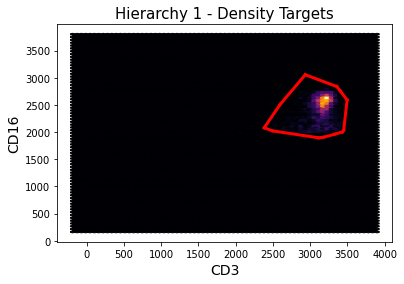

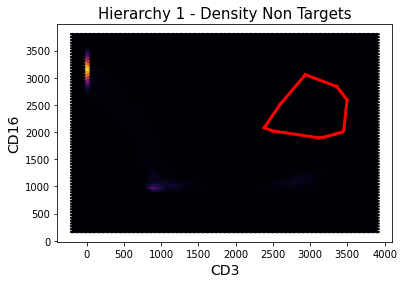

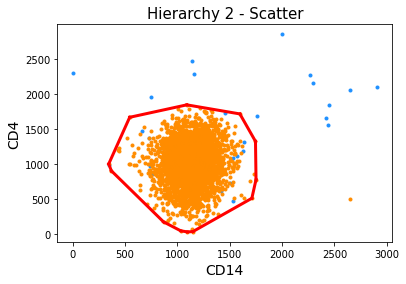

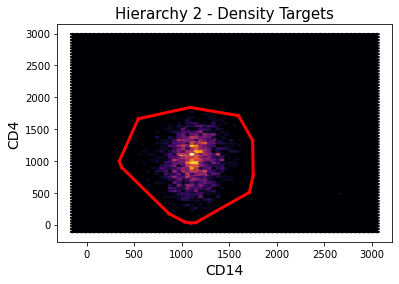

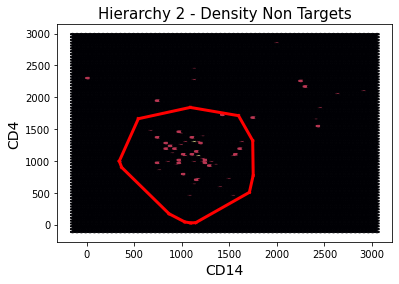

In [81]:
group = ['CD16+ CD8+ T cell'] #
cluster_string = 'manual cell type lvl 3'
panel = ['CD3','CD4','CD8','CD14','CD16']
cell_data = cg.preprocess_adata_gating(adata_full, cluster_string = cluster_string)
save_path = './../data/FACS_COVID_LB/cg_lvl3/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = panel,
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )

meta_info = {}
meta_info["clusterkeys"] = keys
meta_info["gating_summary"] = gating_core
meta_info["general_summary"] = gating_overview
np.save(os.path.join(save_path, "meta_info_cd8_jointcytof.npy"), meta_info)

for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

Update result plots.

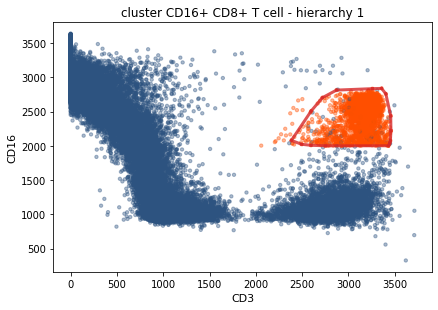

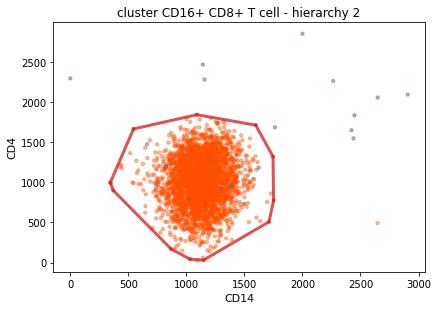

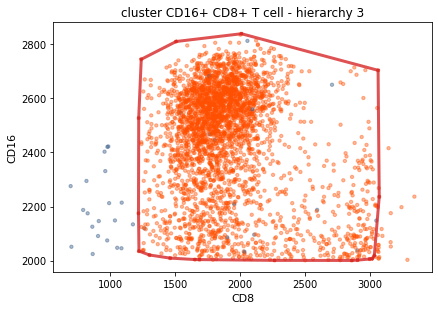

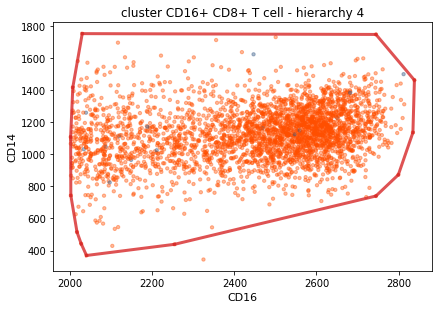

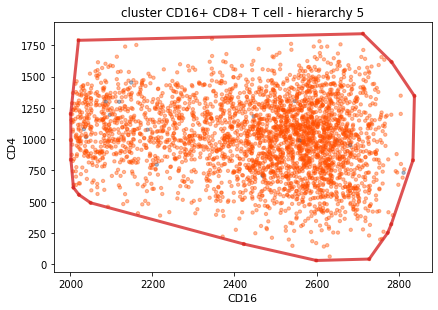

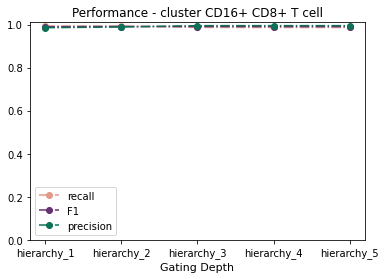

In [82]:
meta_info_path = os.path.join(save_path, "meta_info_cd8_jointcytof.npy")
for key in keys:
    target_location = os.path.join(save_path, 'cytof')
    Path(target_location).mkdir(parents=True, exist_ok=True)
    ch.convex_hull_add_on(meta_info_path,target_location)

End of this notebook.